# 🇹🇼 DWthon 4.0 - прогнозирование банкротства фирм в Тайване (на реальных данных) 🇹🇼

Данные были собраны из Тайваньского экономического журнала за **1999-2009** годы. Банкротство определяется на основании правил ведения бизнеса **Тайваньской фондовой биржи**.

![](../images/taiwan.png)

**Метрикой успеха будет: F1**

### 🤓 Kaggle 
Ссылка для присоединения к конкурсу в Kaggle [ЗДЕСЬ](https://www.kaggle.com/t/7b4d7ffaee284724a32846ea7826982f).

## 💪  Начинаем!

In [1]:
%matplotlib inline

# подключаем библиотеку функций для оптимизации работы с моделями
# https://github.com/alukyantsev/magic_ds/tree/main/ml
from magic_ds_20211201 import *
from magic_ds_20211201.ml import *

# подключаем модели
from magic_ds_20211201.ml.model_boost import *

Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)


### Чтение из файла

In [14]:
df_train = pd.read_hdf("./input/train_taiwan.h5")
df_test = pd.read_hdf("./input/test_taiwan.h5")
df = pd.concat([df_train, df_test]).reset_index(drop=True)

df.columns = rename_columns(df)
df_train.shape, df_test.shape, df.shape

((3409, 97), (3410, 96), (6819, 97))

In [3]:
df

,target,roa(c)_before_tax_and_interest_before_depreciation,roa(a)_after_tax_and_before_interest%,"roa(b)_after_tax_and_before_interest,_before_depreciation",operating_gross_profit_margin,already_realized_gross_profit_margin_of_sales,operating_profit_rate,net_profit_margin_before_tax,net_profit_margin_after_tax,non-industry_revenue_and_expenditure/revenue,continuous_profit_rate_(after_tax),business_expense_rate,research_and_development_expense_ratio,cash_flow_ratio,interest-bearing_debt_interest_rate,tax_rate_(a),book_value_per_share_(b),book_value_per_share_(a),book_value_per_share_(c),persistent_eps_in_the_last_four_seasons,cash_flow_per_share,turnover_per_share_(rmb),operating_profit_per_share_(rmb),net_profit_per_share_before_tax_(yuan),realized_sales_gross_profit_growth_rate,operating_profit_growth_rate,after-tax_net_profit_growth_rate,regular_net_profit_growth_rate,permanent_net_profit_growth_rate,total_assets_growth_rate_,net_worth_growth_rate,return_on_total_assets_growth_rate,cash_reinvestment_%,current_ratio,quick_ratio,interest_expense_ratio,total_debt/total_net_worth,debt_ratio%,net_value/asset,long-term_fund_suitability_ratio_(a),borrowing_dependency,contingent_liabilities/net_value,operating_profit/paid-in_capital,pre-tax_net_profit/real_income_capital,inventory_and_accounts_receivable/net_value,total_asset_turnover,accounts_receivable_turnover,average_collection_days,inventory_turnover_rate_(times),fixed_asset_turnover_times,net_worth_turnover_rate_(times),revenue_per_person,operating_profit_per_person,equipment_rate_per_person,working_capital_to_total_assets,quick_asset/total_asset,current_assets/total_assets,cash_/_total_assets,quick_asset/current_liabilities,cash_/_current_liability,current_liability_to_assets,operating_funds_to_liability,inventory/working_capital,inventory/current_liability,current_liability_/_liability,working_capital/equity,current_liability/equity,lo_ng-term_liability_to_current_assets,retained_earnings/total_assets,total_income_/_total_expense,total_expense_/assets,current_asset_turnover_rate,quick_asset_turnover_rate,working_capitcal_turnover_rate,cash_turnover_rate,cash_flow_to_sales,fix_assets_to_assets,current_liability_to_liability,current_liability_to_equity,equity_to_long-term_liability,cash_flow_to_total_assets,cash_flow_to_liability,cfo_to_assets,cash_flow_to_equity,current_liabilities_to_current_assets,one_if_total_liabilities_exceeds_total_assets_zero_otherwise,net_income_to_total_assets,total_assets_to_gnp_price,no-credit_interval,gross_profit_to_sales,net_income_to_stockholder's_equity,liability_to_equity,degree_of_financial_leverage_(dfl),interest_coverage_ratio(_interest_expense_to_ebit_),one_if_net_income_was_negative_for_the_last_two_year_zero_otherwise,equity_to_liability,id
0,0.00,0.42,0.48,0.47,0.60,0.60,1.00,0.80,0.81,0.30,0.78,0.00,0.00,0.45,0.00,0.00,0.15,0.15,0.15,0.21,0.32,0.00,0.09,0.17,0.02,0.85,0.69,0.69,0.22,0.00,0.00,0.27,0.37,0.07,0.06,0.63,0.00,0.02,0.98,0.04,0.37,0.01,0.09,0.16,0.40,0.04,0.00,0.01,0.00,0.00,0.01,0.01,0.38,0.00,0.96,0.86,0.85,0.71,0.07,0.16,0.02,0.32,0.28,0.01,0.93,0.74,0.33,0.00,0.86,0.00,0.03,0.00,0.00,0.59,0.00,0.67,0.01,0.93,0.33,0.11,0.69,0.50,0.55,0.32,0.00,0,0.77,0.00,0.62,0.60,0.84,0.28,0.03,0.57,1,0.17,0
1,0.00,0.49,0.55,0.54,0.60,0.60,1.00,0.80,0.81,0.30,0.78,0.00,0.00,0.46,0.00,0.08,0.17,0.17,0.17,0.22,0.31,0.05,0.10,0.17,0.02,0.85,0.69,0.69,0.22,0.00,0.00,0.26,0.37,0.01,0.01,0.63,0.01,0.15,0.85,0.01,0.37,0.01,0.10,0.17,0.41,0.24,0.00,0.01,0.00,0.00,0.06,0.02,0.39,0.00,0.82,0.47,0.74,0.08,0.01,0.00,0.15,0.33,0.28,0.01,0.99,0.74,0.33,0.00,0.93,0.00,0.04,0.00,0.00,0.59,0.00,0.67,0.11,0.99,0.33,0.11,0.59,0.45,0.53,0.30,0.03,0,0.80,0.01,0.62,0.60,0.84,0.28,0.03,0.57,1,0.03,4
2,0.00,0.50,0.56,0.56,0.61,0.61,1.00,0.80,0.81,0.30,0.78,0.00,0.00,0.47,0.00,0.12,0.18,0.18,0.18,0.22,0.33,0.02,0.11,0.18,0.02,0.85,0.69,0.69,0.22,0.00,0.00,0.26,0.38,0.00,0.00,0.63,0.01,0.16,0.84,0.01,0.38,0.01,0.11,0.18,0.40,0.07,0.00,0.01,0.00,0.00,0.03,0.01,0

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6819 entries, 0 to 6818
Data columns (total 97 columns):
 #   Column                                                               Non-Null Count  Dtype  
---  ------                                                               --------------  -----  
 0   target                                                               3409 non-null   float64
 1   roa(c)_before_tax_and_interest_before_depreciation                   6819 non-null   float64
 2   roa(a)_after_tax_and_before_interest%                                6819 non-null   float64
 3   roa(b)_after_tax_and_before_interest,_before_depreciation            6819 non-null   float64
 4   operating_gross_profit_margin                                        6819 non-null   float64
 5   already_realized_gross_profit_margin_of_sales                        6819 non-null   float64
 6   operating_profit_rate                                                6819 non-null   float64
 7   net_pr

### Визуализируем пропуски

In [5]:
gap_info(df)

Your selected dataframe has 97 columns.
There are 1 columns that have missing values.


,Missing Values,% of Total Values
target,3410,50.00


In [6]:
#df = drop_gap(df)

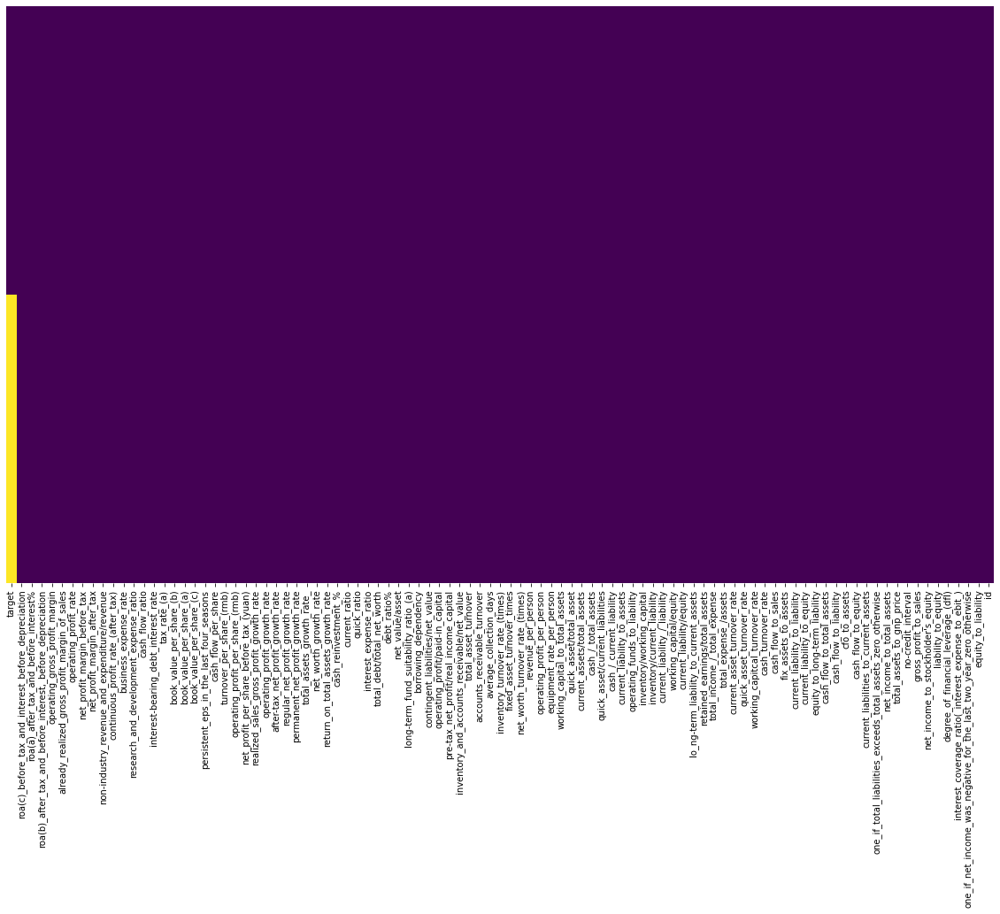

In [7]:
visualize_gap(df)

### Смотрим основные значения

In [8]:
df.sample(10)

,target,roa(c)_before_tax_and_interest_before_depreciation,roa(a)_after_tax_and_before_interest%,"roa(b)_after_tax_and_before_interest,_before_depreciation",operating_gross_profit_margin,already_realized_gross_profit_margin_of_sales,operating_profit_rate,net_profit_margin_before_tax,net_profit_margin_after_tax,non-industry_revenue_and_expenditure/revenue,continuous_profit_rate_(after_tax),business_expense_rate,research_and_development_expense_ratio,cash_flow_ratio,interest-bearing_debt_interest_rate,tax_rate_(a),book_value_per_share_(b),book_value_per_share_(a),book_value_per_share_(c),persistent_eps_in_the_last_four_seasons,cash_flow_per_share,turnover_per_share_(rmb),operating_profit_per_share_(rmb),net_profit_per_share_before_tax_(yuan),realized_sales_gross_profit_growth_rate,operating_profit_growth_rate,after-tax_net_profit_growth_rate,regular_net_profit_growth_rate,permanent_net_profit_growth_rate,total_assets_growth_rate_,net_worth_growth_rate,return_on_total_assets_growth_rate,cash_reinvestment_%,current_ratio,quick_ratio,interest_expense_ratio,total_debt/total_net_worth,debt_ratio%,net_value/asset,long-term_fund_suitability_ratio_(a),borrowing_dependency,contingent_liabilities/net_value,operating_profit/paid-in_capital,pre-tax_net_profit/real_income_capital,inventory_and_accounts_receivable/net_value,total_asset_turnover,accounts_receivable_turnover,average_collection_days,inventory_turnover_rate_(times),fixed_asset_turnover_times,net_worth_turnover_rate_(times),revenue_per_person,operating_profit_per_person,equipment_rate_per_person,working_capital_to_total_assets,quick_asset/total_asset,current_assets/total_assets,cash_/_total_assets,quick_asset/current_liabilities,cash_/_current_liability,current_liability_to_assets,operating_funds_to_liability,inventory/working_capital,inventory/current_liability,current_liability_/_liability,working_capital/equity,current_liability/equity,lo_ng-term_liability_to_current_assets,retained_earnings/total_assets,total_income_/_total_expense,total_expense_/assets,current_asset_turnover_rate,quick_asset_turnover_rate,working_capitcal_turnover_rate,cash_turnover_rate,cash_flow_to_sales,fix_assets_to_assets,current_liability_to_liability,current_liability_to_equity,equity_to_long-term_liability,cash_flow_to_total_assets,cash_flow_to_liability,cfo_to_assets,cash_flow_to_equity,current_liabilities_to_current_assets,one_if_total_liabilities_exceeds_total_assets_zero_otherwise,net_income_to_total_assets,total_assets_to_gnp_price,no-credit_interval,gross_profit_to_sales,net_income_to_stockholder's_equity,liability_to_equity,degree_of_financial_leverage_(dfl),interest_coverage_ratio(_interest_expense_to_ebit_),one_if_net_income_was_negative_for_the_last_two_year_zero_otherwise,equity_to_liability,id
1443,0.00,0.62,0.70,0.69,0.62,0.62,1.00,0.80,0.81,0.30,0.78,0.00,0.00,0.47,0.00,0.00,0.20,0.20,0.20,0.28,0.34,0.05,0.15,0.22,0.02,0.85,0.69,0.69,0.22,0.00,0.00,0.27,0.41,0.02,0.01,0.63,0.00,0.09,0.91,0.03,0.37,0.01,0.15,0.22,0.40,0.21,0.00,0.01,0.00,0.01,0.04,0.06,0.44,0.00,0.90,0.75,0.86,0.44,0.01,0.02,0.10,0.37,0.28,0.01,0.99,0.74,0.33,0.00,0.96,0.00,0.04,0.00,0.00,0.59,0.00,0.67,0.01,0.99,0.33,0.11,0.73,0.48,0.67,0.33,0.02,0,0.88,0.00,0.62,0.62,0.85,0.28,0.03,0.57,1,0.04,2902
5748,NaN,0.54,0.60,0.59,0.62,0.62,1.00,0.80,0.81,0.30,0.78,0.00,0.00,0.48,0.00,0.02,0.31,0.31,0.31,0.27,0.35,0.06,0.14,0.22,0.02,0.85,0.69,0.69,0.22,0.00,0.00,0.26,0.38,0.03,0.03,0.63,0.00,0.04,0.96,0.01,0.37,0.01,0.14,0.21,0.40,0.12,0.00,0.00,0.00,0.00,0.02,0.03,0.41,0.01,0.92,0.68,0.75,0.55,0.03,0.07,0.04,0.40,0.28,0.01,0.99,0.74,0.33,0.00,0.95,0.00,0.04,0.00,0.00,0.59,0.00,0.67,0.10,0.99,0.33,0.11,0.61,0.44,0.65,0.31,0.01,0,0.83,0.00,0.62,0.62,0.84,0.28,0.03,0.57,1,0.10,4697
3615,NaN,0.53,0.59,0.58,0.64,0.64,1.00,0.80,0.81,0.30,0.78,0.00,0.00,0.47,0.00,0.14,0.18,0.18,0.18,0.23,0.33,0.03,0.11,0.19,0.02,0.85,0.69,0.69,0.22,0.00,0.00,0.26,0.38,0.01,0.01,0.63,0.00,0.09,0.91,0.01,0.37,0.01,0.11,0.19,0.40,0.14,0.00,0.00,0.00,0.0

In [9]:
analyze_unique(df)

==================== target (2 unique) ====================
0.00    3299
1.00     110
Name: target, dtype: int64 

==================== roa(c)_before_tax_and_interest_before_depreciation (3333 unique) ====================
0.49    12
0.52    11
0.50    10
0.51    10
0.50     9
        ..
0.52     1
0.45     1
0.59     1
0.41     1
0.48     1
Name: roa(c)_before_tax_and_interest_before_depreciation, Length: 3333, dtype: int64 

==================== roa(a)_after_tax_and_before_interest% (3151 unique) ====================
0.57    13
0.56    13
0.55    10
0.56    10
0.56    10
        ..
0.60     1
0.34     1
0.58     1
0.66     1
0.53     1
Name: roa(a)_after_tax_and_before_interest%, Length: 3151, dtype: int64 

==================== roa(b)_after_tax_and_before_interest,_before_depreciation (3160 unique) ====================
0.55    10
0.54    10
0.55    10
0.56    10
0.55     9
        ..
0.57     1
0.60     1
0.51     1
0.63     1
0.60     1
Name: roa(b)_after_tax_and_before_interest,_be

==================== operating_profit_per_person (3023 unique) ====================
0.39    13
0.39    11
0.39    11
0.39    11
0.40    11
        ..
0.41     1
0.43     1
0.41     1
0.42     1
0.38     1
Name: operating_profit_per_person, Length: 3023, dtype: int64 

==================== equipment_rate_per_person (6768 unique) ====================
0.00    6
0.01    2
0.00    2
0.00    2
0.00    2
       ..
0.00    1
0.03    1
0.00    1
0.01    1
0.00    1
Name: equipment_rate_per_person, Length: 6768, dtype: int64 

==================== working_capital_to_total_assets (6819 unique) ====================
0.96    1
0.81    1
0.82    1
0.80    1
0.85    1
       ..
0.81    1
0.76    1
0.83    1
0.85    1
0.87    1
Name: working_capital_to_total_assets, Length: 6819, dtype: int64 

==================== quick_asset/total_asset (6819 unique) ====================
0.86    1
0.17    1
0.52    1
0.20    1
0.55    1
       ..
0.44    1
0.19    1
0.32    1
0.49    1
0.59    1
Name: quick_asset/tot

0.67    4
0.60    1
0.61    1
0.60    1
0.60    1
       ..
0.60    1
0.61    1
0.60    1
0.60    1
0.62    1
Name: gross_profit_to_sales, Length: 6816, dtype: int64 

==================== net_income_to_stockholder's_equity (6819 unique) ====================
0.84    1
0.84    1
0.84    1
0.84    1
0.84    1
       ..
0.84    1
0.84    1
0.84    1
0.84    1
0.84    1
Name: net_income_to_stockholder's_equity, Length: 6819, dtype: int64 

==================== liability_to_equity (6819 unique) ====================
0.28    1
0.28    1
0.28    1
0.28    1
0.28    1
       ..
0.28    1
0.28    1
0.28    1
0.28    1
0.28    1
Name: liability_to_equity, Length: 6819, dtype: int64 

==================== degree_of_financial_leverage_(dfl) (6240 unique) ====================
0.03    580
0.03      1
0.03      1
0.03      1
0.03      1
       ... 
0.03      1
0.03      1
0.03      1
0.03      1
0.03      1
Name: degree_of_financial_leverage_(dfl), Length: 6240, dtype: int64 

==================== int

In [10]:
analyze_target(df, target='target')

==================== roa(c)_before_tax_and_interest_before_depreciation ====================
      roa(c)_before_tax_and_interest_before_depreciation  target
0                                                  0.00     0.00
1                                                  0.02     1.00
2                                                  0.07     1.00
3                                                  0.08     0.00
4                                                  0.20     1.00
...                                                 ...      ...
2243                                               0.75     0.00
2244                                               0.76     0.00
2245                                               0.82     0.00
2246                                               0.86     0.00
2247                                               1.00     0.00

[2248 rows x 2 columns] 

==================== roa(a)_after_tax_and_before_interest% ====================
      roa(a)_after_t

      tax_rate_(a)  target
0             0.00    0.08
1             0.00    0.00
2             0.00    0.00
3             0.00    0.00
4             0.00    0.00
...            ...     ...
1552          0.94    0.00
1553          0.95    0.00
1554          0.96    0.00
1555          0.98    1.00
1556          0.99    0.00

[1557 rows x 2 columns] 

==================== book_value_per_share_(b) ====================
      book_value_per_share_(b)  target
0                         0.00    0.00
1                         0.10    1.00
2                         0.12    1.00
3                         0.12    1.00
4                         0.12    1.00
...                        ...     ...
1651                      0.41    0.00
1652                      0.43    0.00
1653                      0.53    0.00
1654                      0.54    0.00
1655                      0.55    0.00

[1656 rows x 2 columns] 

==================== book_value_per_share_(a) ====================
      book_value_per

      net_value/asset  target
0                0.00    0.00
1                0.66    1.00
2                0.67    1.00
3                0.67    1.00
4                0.68    1.00
...               ...     ...
2634             1.00    0.00
2635             1.00    0.00
2636             1.00    0.00
2637             1.00    0.00
2638             1.00    0.00

[2639 rows x 2 columns] 

==================== long-term_fund_suitability_ratio_(a) ====================
      long-term_fund_suitability_ratio_(a)  target
0                                     0.00    0.00
1                                     0.00    1.00
2                                     0.00    1.00
3                                     0.00    0.00
4                                     0.00    0.00
...                                    ...     ...
3340                                  0.30    0.00
3341                                  0.32    0.00
3342                                  0.48    0.00
3343                    

      current_liability_to_assets  target
0                            0.00    0.00
1                            0.00    0.00
2                            0.00    0.00
3                            0.00    0.00
4                            0.00    0.00
...                           ...     ...
3404                         0.28    0.00
3405                         0.32    0.00
3406                         0.34    1.00
3407                         0.34    1.00
3408                         1.00    0.00

[3409 rows x 2 columns] 

==================== operating_funds_to_liability ====================
      operating_funds_to_liability  target
0                             0.01    0.00
1                             0.09    0.00
2                             0.12    0.00
3                             0.16    0.00
4                             0.17    0.00
...                            ...     ...
3404                          0.69    0.00
3405                          0.71    0.00
3406       

      cfo_to_assets  target
0              0.00    0.00
1              0.21    0.00
2              0.26    0.00
3              0.27    0.00
4              0.29    0.00
...             ...     ...
3404           0.89    0.00
3405           0.93    0.00
3406           0.97    0.00
3407           0.98    0.00
3408           0.98    0.00

[3409 rows x 2 columns] 

==================== cash_flow_to_equity ====================
      cash_flow_to_equity  target
0                    0.17    0.00
1                    0.20    1.00
2                    0.24    1.00
3                    0.25    1.00
4                    0.25    0.00
...                   ...     ...
3404                 0.36    0.00
3405                 0.36    0.00
3406                 0.38    0.00
3407                 0.49    1.00
3408                 0.51    0.00

[3409 rows x 2 columns] 

==================== current_liabilities_to_current_assets ====================
      current_liabilities_to_current_assets  target
0       

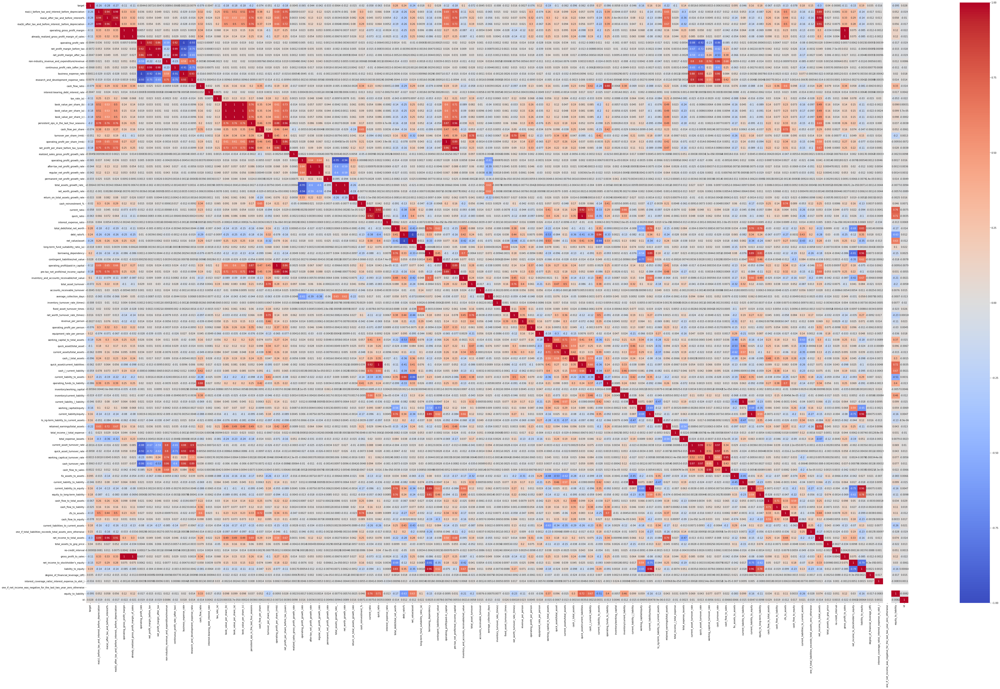

In [11]:
visualize_corr(df, size=(80,48))

### Обрабатываем данные

In [12]:
# удаляем ненужные колонки
df = drop_features(df, ['id', 'one_if_net_income_was_negative_for_the_last_two_year_zero_otherwise'])

In [13]:
# находим сильно коррелирующие признаки и удаляем их
df = drop_corr(df, limit=0.98)

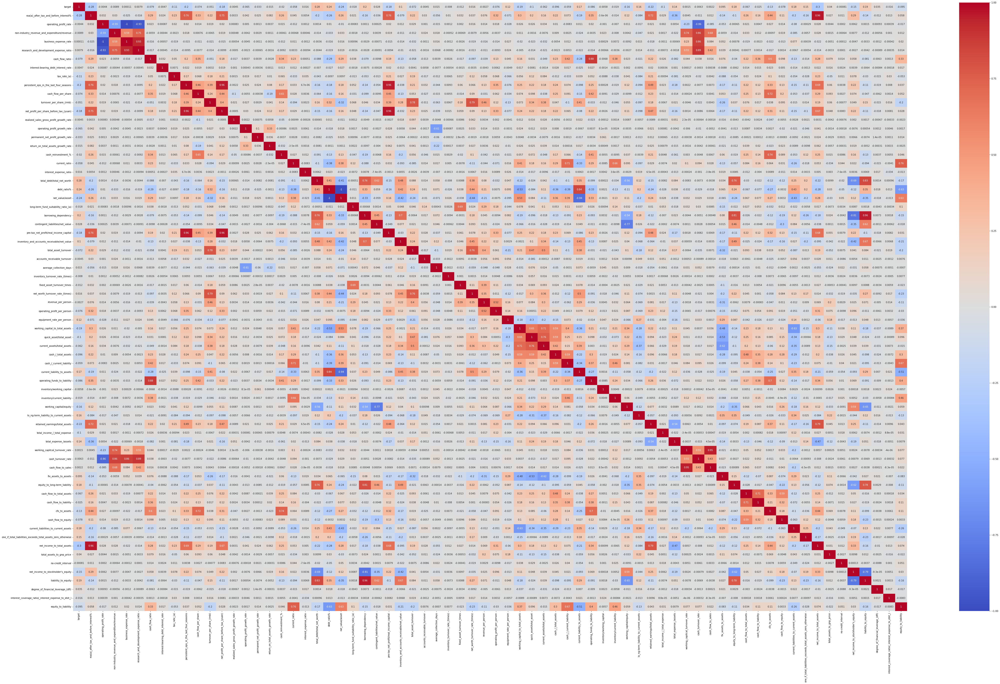

In [14]:
# проверяем корреляцию
visualize_corr(df, size=(80,48))

In [15]:
# проверяем на негативные значения
list_negative = gap_negative(df)
len(list_negative)

0	- target
0	- roa(a)_after_tax_and_before_interest%
0	- operating_profit_rate
0	- non-industry_revenue_and_expenditure/revenue
0	- business_expense_rate
0	- research_and_development_expense_ratio
0	- cash_flow_ratio
0	- interest-bearing_debt_interest_rate
0	- tax_rate_(a)
0	- persistent_eps_in_the_last_four_seasons
0	- cash_flow_per_share
0	- turnover_per_share_(rmb)
0	- net_profit_per_share_before_tax_(yuan)
0	- realized_sales_gross_profit_growth_rate
0	- operating_profit_growth_rate
0	- permanent_net_profit_growth_rate
0	- return_on_total_assets_growth_rate
0	- cash_reinvestment_%
0	- current_ratio
0	- interest_expense_ratio
0	- total_debt/total_net_worth
0	- debt_ratio%
0	- net_value/asset
0	- long-term_fund_suitability_ratio_(a)
0	- borrowing_dependency
0	- contingent_liabilities/net_value
0	- pre-tax_net_profit/real_income_capital
0	- inventory_and_accounts_receivable/net_value
0	- total_asset_turnover
0	- accounts_receivable_turnover
0	- average_collection_days
0	- inventory_tur

0

In [16]:
if len(list_negative) > 0:
    df = fillna_negative(df, list_negative)
    gap_negative(df)

In [17]:
df

,target,roa(a)_after_tax_and_before_interest%,operating_profit_rate,non-industry_revenue_and_expenditure/revenue,business_expense_rate,research_and_development_expense_ratio,cash_flow_ratio,interest-bearing_debt_interest_rate,tax_rate_(a),persistent_eps_in_the_last_four_seasons,cash_flow_per_share,turnover_per_share_(rmb),net_profit_per_share_before_tax_(yuan),realized_sales_gross_profit_growth_rate,operating_profit_growth_rate,permanent_net_profit_growth_rate,return_on_total_assets_growth_rate,cash_reinvestment_%,current_ratio,interest_expense_ratio,total_debt/total_net_worth,debt_ratio%,net_value/asset,long-term_fund_suitability_ratio_(a),borrowing_dependency,contingent_liabilities/net_value,pre-tax_net_profit/real_income_capital,inventory_and_accounts_receivable/net_value,total_asset_turnover,accounts_receivable_turnover,average_collection_days,inventory_turnover_rate_(times),fixed_asset_turnover_times,net_worth_turnover_rate_(times),revenue_per_person,operating_profit_per_person,equipment_rate_per_person,working_capital_to_total_assets,quick_asset/total_asset,current_assets/total_assets,cash_/_total_assets,cash_/_current_liability,current_liability_to_assets,operating_funds_to_liability,inventory/working_capital,inventory/current_liability,working_capital/equity,lo_ng-term_liability_to_current_assets,retained_earnings/total_assets,total_income_/_total_expense,total_expense_/assets,working_capitcal_turnover_rate,cash_turnover_rate,cash_flow_to_sales,fix_assets_to_assets,equity_to_long-term_liability,cash_flow_to_total_assets,cash_flow_to_liability,cfo_to_assets,cash_flow_to_equity,current_liabilities_to_current_assets,one_if_total_liabilities_exceeds_total_assets_zero_otherwise,net_income_to_total_assets,total_assets_to_gnp_price,no-credit_interval,net_income_to_stockholder's_equity,liability_to_equity,degree_of_financial_leverage_(dfl),interest_coverage_ratio(_interest_expense_to_ebit_),equity_to_liability
0,0.00,0.48,1.00,0.30,0.00,0.00,0.45,0.00,0.00,0.21,0.32,0.00,0.17,0.02,0.85,0.22,0.27,0.37,0.07,0.63,0.00,0.02,0.98,0.04,0.37,0.01,0.16,0.40,0.04,0.00,0.01,0.00,0.00,0.01,0.01,0.38,0.00,0.96,0.86,0.85,0.71,0.16,0.02,0.32,0.28,0.01,0.74,0.00,0.86,0.00,0.03,0.59,0.00,0.67,0.01,0.11,0.69,0.50,0.55,0.32,0.00,0,0.77,0.00,0.62,0.84,0.28,0.03,0.57,0.17
1,0.00,0.55,1.00,0.30,0.00,0.00,0.46,0.00,0.08,0.22,0.31,0.05,0.17,0.02,0.85,0.22,0.26,0.37,0.01,0.63,0.01,0.15,0.85,0.01,0.37,0.01,0.17,0.41,0.24,0.00,0.01,0.00,0.00,0.06,0.02,0.39,0.00,0.82,0.47,0.74,0.08,0.00,0.15,0.33,0.28,0.01,0.74,0.00,0.93,0.00,0.04,0.59,0.00,0.67,0.11,0.11,0.59,0.45,0.53,0.30,0.03,0,0.80,0.01,0.62,0.84,0.28,0.03,0.57,0.03
2,0.00,0.56,1.00,0.30,0.00,0.00,0.47,0.00,0.12,0.22,0.33,0.02,0.18,0.02,0.85,0.22,0.26,0.38,0.00,0.63,0.01,0.16,0.84,0.01,0.38,0.01,0.18,0.40,0.07,0.00,0.01,0.00,0.00,0.03,0.01,0.40,0.02,0.72,0.21,0.22,0.01,0.00,0.10,0.35,0.28,0.00,0.73,0.03,0.93,0.00,0.01,0.59,0.00,0.67,0.57,0.12,0.64,0.46,0.60,0.31,0.07,0,0.81,0.00,0.63,0.84,0.28,0.03,0.57,0.02
3,0.00,0.54,1.00,0.30,0.00,0.00,0.46,0.00,0.52,0.22,0.31,0.07,0.18,0.02,0.85,0.22,0.26,0.37,0.01,0.63,0.01,0.15,0.85,0.01,0.37,0.01,0.18,0.41,0.28,0.00,0.01,0.00,0.00,0.07,0.06,0.40,0.01,0.86,0.67,0.81,0.25,0.01,0.13,0.34,0.28,0.01,0.74,0.00,0.93,0.00,0.03,0.59,0.00,0.67,0.17,0.11,0.65,0.46,0.54,0.32,0.03,0,0.80,0.00,0.62,0.84,0.28,0.03,0.57,0.02
4,0.00,0.48,1.00,0.30,0.00,0.00,0.46,0.00,0.00,0.20,0.32,0.02,0.16,0.02,0.85,0.22,0.26,0.38,0.01,0.63,0.01,0.14,0.86,0.00,0.38,0.01,0.16,0.40,0.13,0.00,0.00,0.00,0.00,0.04,0.02,0.38,0.03,0.75,0.10,0.36,0.01,0.00,0.12,0.34,0.27,0.01,0.73,0.00,0.90,0.00,0.01,0.59,0.00,0.67,0.63,0.11,0.64,0.46,0.58,0.31,0.05,0,0.76,0.00,0.62,0.84,0.28,0.03,0.56,0.03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6814,NaN,0.59,1.00,0.30,0.0

### Кодируем параметры через One-hot-encoding

In [18]:
# кодируем фичи через one-hot-encoding
ohe_list = ['one_if_total_liabilities_exceeds_total_assets_zero_otherwise']
df = encode_ohe_full(df, ohe_list)
df

,target,roa(a)_after_tax_and_before_interest%,operating_profit_rate,non-industry_revenue_and_expenditure/revenue,business_expense_rate,research_and_development_expense_ratio,cash_flow_ratio,interest-bearing_debt_interest_rate,tax_rate_(a),persistent_eps_in_the_last_four_seasons,cash_flow_per_share,turnover_per_share_(rmb),net_profit_per_share_before_tax_(yuan),realized_sales_gross_profit_growth_rate,operating_profit_growth_rate,permanent_net_profit_growth_rate,return_on_total_assets_growth_rate,cash_reinvestment_%,current_ratio,interest_expense_ratio,total_debt/total_net_worth,debt_ratio%,net_value/asset,long-term_fund_suitability_ratio_(a),borrowing_dependency,contingent_liabilities/net_value,pre-tax_net_profit/real_income_capital,inventory_and_accounts_receivable/net_value,total_asset_turnover,accounts_receivable_turnover,average_collection_days,inventory_turnover_rate_(times),fixed_asset_turnover_times,net_worth_turnover_rate_(times),revenue_per_person,operating_profit_per_person,equipment_rate_per_person,working_capital_to_total_assets,quick_asset/total_asset,current_assets/total_assets,cash_/_total_assets,cash_/_current_liability,current_liability_to_assets,operating_funds_to_liability,inventory/working_capital,inventory/current_liability,working_capital/equity,lo_ng-term_liability_to_current_assets,retained_earnings/total_assets,total_income_/_total_expense,total_expense_/assets,working_capitcal_turnover_rate,cash_turnover_rate,cash_flow_to_sales,fix_assets_to_assets,equity_to_long-term_liability,cash_flow_to_total_assets,cash_flow_to_liability,cfo_to_assets,cash_flow_to_equity,current_liabilities_to_current_assets,net_income_to_total_assets,total_assets_to_gnp_price,no-credit_interval,net_income_to_stockholder's_equity,liability_to_equity,degree_of_financial_leverage_(dfl),interest_coverage_ratio(_interest_expense_to_ebit_),equity_to_liability,one_if_total_liabilities_exceeds_total_assets_zero_otherwise_0,one_if_total_liabilities_exceeds_total_assets_zero_otherwise_1
0,0.00,0.48,1.00,0.30,0.00,0.00,0.45,0.00,0.00,0.21,0.32,0.00,0.17,0.02,0.85,0.22,0.27,0.37,0.07,0.63,0.00,0.02,0.98,0.04,0.37,0.01,0.16,0.40,0.04,0.00,0.01,0.00,0.00,0.01,0.01,0.38,0.00,0.96,0.86,0.85,0.71,0.16,0.02,0.32,0.28,0.01,0.74,0.00,0.86,0.00,0.03,0.59,0.00,0.67,0.01,0.11,0.69,0.50,0.55,0.32,0.00,0.77,0.00,0.62,0.84,0.28,0.03,0.57,0.17,1,0
1,0.00,0.55,1.00,0.30,0.00,0.00,0.46,0.00,0.08,0.22,0.31,0.05,0.17,0.02,0.85,0.22,0.26,0.37,0.01,0.63,0.01,0.15,0.85,0.01,0.37,0.01,0.17,0.41,0.24,0.00,0.01,0.00,0.00,0.06,0.02,0.39,0.00,0.82,0.47,0.74,0.08,0.00,0.15,0.33,0.28,0.01,0.74,0.00,0.93,0.00,0.04,0.59,0.00,0.67,0.11,0.11,0.59,0.45,0.53,0.30,0.03,0.80,0.01,0.62,0.84,0.28,0.03,0.57,0.03,1,0
2,0.00,0.56,1.00,0.30,0.00,0.00,0.47,0.00,0.12,0.22,0.33,0.02,0.18,0.02,0.85,0.22,0.26,0.38,0.00,0.63,0.01,0.16,0.84,0.01,0.38,0.01,0.18,0.40,0.07,0.00,0.01,0.00,0.00,0.03,0.01,0.40,0.02,0.72,0.21,0.22,0.01,0.00,0.10,0.35,0.28,0.00,0.73,0.03,0.93,0.00,0.01,0.59,0.00,0.67,0.57,0.12,0.64,0.46,0.60,0.31,0.07,0.81,0.00,0.63,0.84,0.28,0.03,0.57,0.02,1,0
3,0.00,0.54,1.00,0.30,0.00,0.00,0.46,0.00,0.52,0.22,0.31,0.07,0.18,0.02,0.85,0.22,0.26,0.37,0.01,0.63,0.01,0.15,0.85,0.01,0.37,0.01,0.18,0.41,0.28,0.00,0.01,0.00,0.00,0.07,0.06,0.40,0.01,0.86,0.67,0.81,0.25,0.01,0.13,0.34,0.28,0.01,0.74,0.00,0.93,0.00,0.03,0.59,0.00,0.67,0.17,0.11,0.65,0.46,0.54,0.32,0.03,0.80,0.00,0.62,0.84,0.28,0.03,0.57,0.02,1,0
4,0.00,0.48,1.00,0.30,0.00,0.00,0.46,0.00,0.00,0.20,0.32,0.02,0.16,0.02,0.85,0.22,0.26,0.38,0.01,0.63,0.01,0.14,0.86,0.00,0.38,0.01,0.16,0.40,0.13,0.00,0.00,0.00,0.00,0.04,0.02,0.38,0.03,0.75,0.10,0.36,0.01,0.00,0.12,0.34,0.27,0.01,0.73,0.00,0.90,0.00,0.01,0.59,0.00,0.67,0.63,0.11,0.64,0.46,0.58,0.31,0.05,0.76,0.00,0.62,0.84,0.28,0.03,0.56,0.03,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,

In [19]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6819 entries, 0 to 6818
Data columns (total 71 columns):
 #   Column                                                          Non-Null Count  Dtype  
---  ------                                                          --------------  -----  
 0   target                                                          3409 non-null   float64
 1   roa(a)_after_tax_and_before_interest%                           6819 non-null   float64
 2   operating_profit_rate                                           6819 non-null   float64
 3   non-industry_revenue_and_expenditure/revenue                    6819 non-null   float64
 4   business_expense_rate                                           6819 non-null   float64
 5   research_and_development_expense_ratio                          6819 non-null   float64
 6   cash_flow_ratio                                                 6819 non-null   float64
 7   interest-bearing_debt_interest_rate                

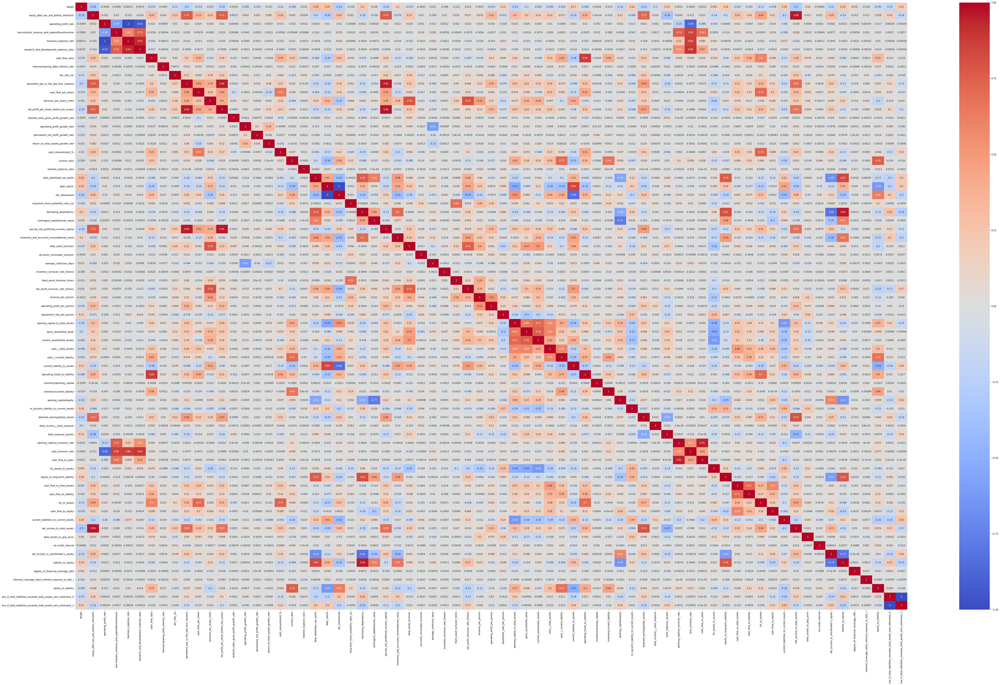

In [20]:
# проверяем корреляцию
visualize_corr(df, size=(80,48))

### Проводим нормировку данных

==================== target ====================


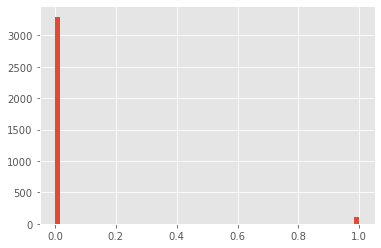

mean :  0.03226752713405691
var  :  0.03122633382670816
skew :  nan
kurt :  nan
shapiro :  ShapiroResult(statistic=nan, pvalue=1.0)
normaltest :  NormaltestResult(statistic=nan, pvalue=nan)


==================== roa(a)_after_tax_and_before_interest% ====================


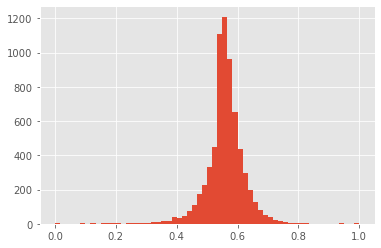

mean :  0.5586249158750483
var  :  0.0043053570034025405
skew :  -1.0334994309305003
kurt :  9.031278783842248
shapiro :  ShapiroResult(statistic=0.8948593735694885, pvalue=0.0)
normaltest :  NormaltestResult(statistic=1976.6237094705657, pvalue=0.0)


==================== operating_profit_rate ====================


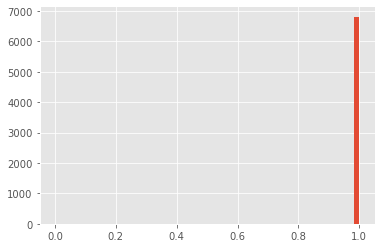

mean :  0.9987551277900447
var  :  0.00016923593098828018
skew :  -70.22171309499198
kurt :  5206.265690579156
shapiro :  ShapiroResult(statistic=0.007278859615325928, pvalue=0.0)
normaltest :  NormaltestResult(statistic=24207.308971627674, pvalue=0.0)


==================== non-industry_revenue_and_expenditure/revenue ====================


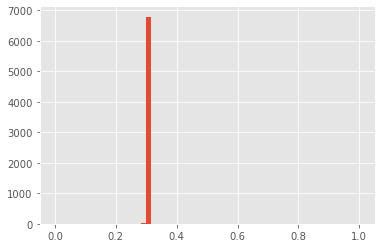

mean :  0.3036229236497336
var  :  0.0001246041132622171
skew :  39.63296852945887
kurt :  2647.4855593046036
shapiro :  ShapiroResult(statistic=0.0171658992767334, pvalue=0.0)
normaltest :  NormaltestResult(statistic=19835.077589551787, pvalue=0.0)


==================== business_expense_rate ====================


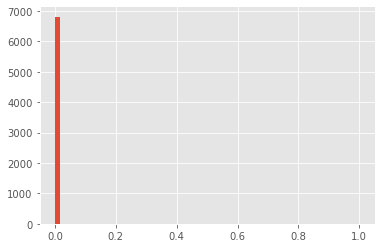

mean :  0.0004437878166691417
var  :  0.0001695315099332331
skew :  70.211809482139
kurt :  5204.963732240465
shapiro :  ShapiroResult(statistic=0.006955265998840332, pvalue=0.0)
normaltest :  NormaltestResult(statistic=24206.157563783443, pvalue=0.0)


==================== research_and_development_expense_ratio ====================


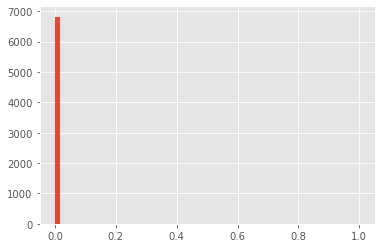

mean :  0.00024430949363989313
var  :  0.0001468496035293158
skew :  82.3496248656881
kurt :  6790.748747923868
shapiro :  ShapiroResult(statistic=0.003838837146759033, pvalue=0.0)
normaltest :  NormaltestResult(statistic=25522.234553154736, pvalue=0.0)


==================== cash_flow_ratio ====================


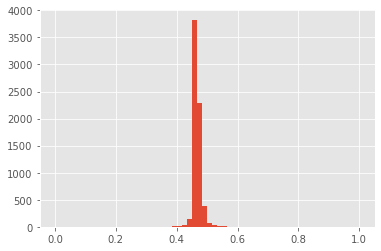

mean :  0.46743118577965936
var  :  0.0002901662911203258
skew :  3.9897076616936533
kurt :  256.82346326667795
shapiro :  ShapiroResult(statistic=0.5531771183013916, pvalue=0.0)
normaltest :  NormaltestResult(statistic=7135.183334852945, pvalue=0.0)


==================== interest-bearing_debt_interest_rate ====================


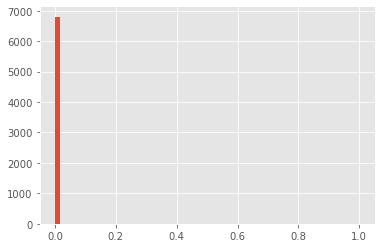

mean :  0.0008262564047869822
var  :  0.0002709168043720512
skew :  51.08279912113898
kurt :  2818.1262286006895
shapiro :  ShapiroResult(statistic=0.013350486755371094, pvalue=0.0)
normaltest :  NormaltestResult(statistic=21666.434283783918, pvalue=0.0)


==================== tax_rate_(a) ====================


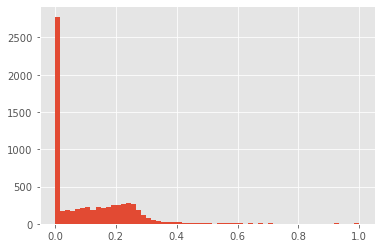

mean :  0.11500074794142387
var  :  0.01922585478167686
skew :  1.9034564247474686
kurt :  6.406758190266412
shapiro :  ShapiroResult(statistic=0.786316454410553, pvalue=0.0)
normaltest :  NormaltestResult(statistic=2808.836382735382, pvalue=0.0)


==================== persistent_eps_in_the_last_four_seasons ====================


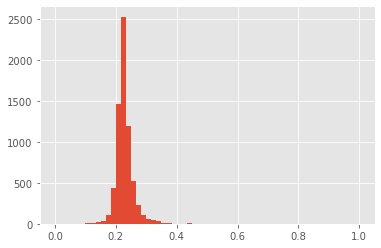

mean :  0.22881285256452769
var  :  0.0011062391759029384
skew :  5.134833207598453
kurt :  81.56107394156099
shapiro :  ShapiroResult(statistic=0.7354207038879395, pvalue=0.0)
normaltest :  NormaltestResult(statistic=7471.233524870369, pvalue=0.0)


==================== cash_flow_per_share ====================


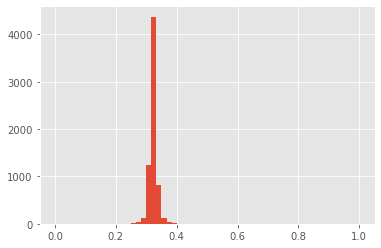

mean :  0.3234819121698314
var  :  0.00031009877286014657
skew :  8.017219480292004
kurt :  352.7595442248043
shapiro :  ShapiroResult(statistic=0.619096040725708, pvalue=0.0)
normaltest :  NormaltestResult(statistic=10037.123597193724, pvalue=0.0)


==================== turnover_per_share_(rmb) ====================


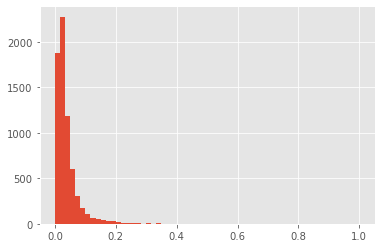

mean :  0.03896365746756665
var  :  0.0020448440298803786
skew :  6.329802426055265
kurt :  84.32989751470917
shapiro :  ShapiroResult(statistic=0.5860522985458374, pvalue=0.0)
normaltest :  NormaltestResult(statistic=8323.22051579647, pvalue=0.0)


==================== net_profit_per_share_before_tax_(yuan) ====================


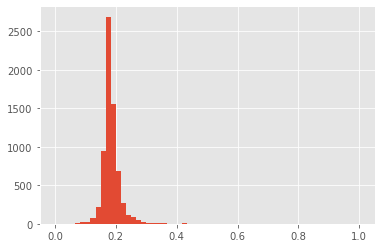

mean :  0.18436057764203417
var  :  0.0011007648182045574
skew :  6.001269658706898
kurt :  100.58406367400923
shapiro :  ShapiroResult(statistic=0.7005993723869324, pvalue=0.0)
normaltest :  NormaltestResult(statistic=8202.38015465586, pvalue=0.0)


==================== realized_sales_gross_profit_growth_rate ====================


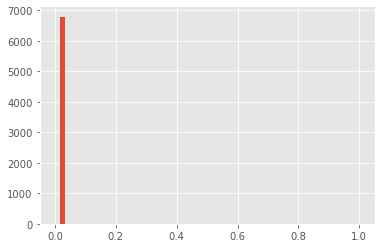

mean :  0.022407854474165916
var  :  0.00014588737004215136
skew :  77.90796654455191
kurt :  6291.000429204531
shapiro :  ShapiroResult(statistic=0.010403215885162354, pvalue=0.0)
normaltest :  NormaltestResult(statistic=25063.419003535066, pvalue=0.0)


==================== operating_profit_growth_rate ====================


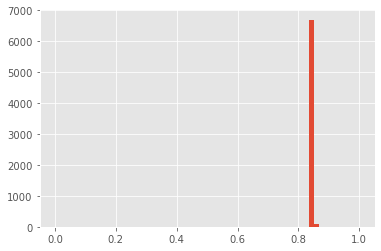

mean :  0.8479799951688095
var  :  0.00011559881540860799
skew :  -71.67317952546637
kurt :  5679.985340486654
shapiro :  ShapiroResult(statistic=0.017376363277435303, pvalue=0.0)
normaltest :  NormaltestResult(statistic=24383.700973932326, pvalue=0.0)


==================== permanent_net_profit_growth_rate ====================


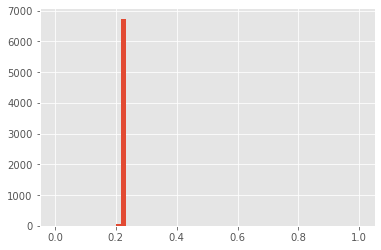

mean :  0.21763901299696622
var  :  0.00010124837712210879
skew :  67.0827737203166
kurt :  5392.615102992282
shapiro :  ShapiroResult(statistic=0.010263800621032715, pvalue=0.0)
normaltest :  NormaltestResult(statistic=23856.74904633179, pvalue=0.0)


==================== return_on_total_assets_growth_rate ====================


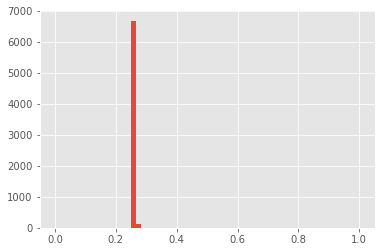

mean :  0.26424751187584206
var  :  9.28043687380315e-05
skew :  62.486211871280595
kurt :  5071.235868899632
shapiro :  ShapiroResult(statistic=0.026346802711486816, pvalue=0.0)
normaltest :  NormaltestResult(statistic=23297.8407923179, pvalue=0.0)


==================== cash_reinvestment_% ====================


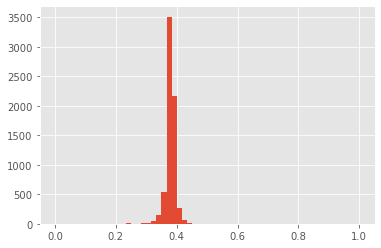

mean :  0.37967667232266106
var  :  0.0004299421017200533
skew :  2.3177343907848296
kurt :  178.92107312314369
shapiro :  ShapiroResult(statistic=0.6228421330451965, pvalue=0.0)
normaltest :  NormaltestResult(statistic=5353.047477810946, pvalue=0.0)


==================== current_ratio ====================


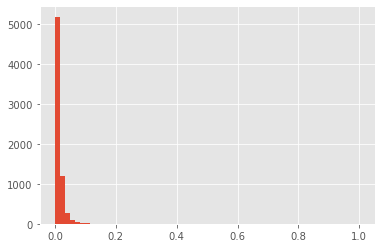

mean :  0.015104344543167421
var  :  0.0005571007546313952
skew :  21.344123901070507
kurt :  692.6187460953979
shapiro :  ShapiroResult(statistic=0.28197383880615234, pvalue=0.0)
normaltest :  NormaltestResult(statistic=15445.227422228068, pvalue=0.0)


==================== interest_expense_ratio ====================


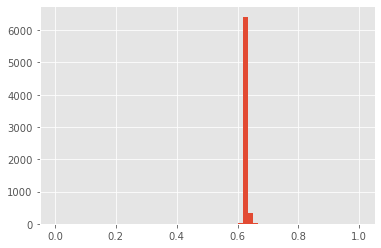

mean :  0.6309910117124139
var  :  0.00012628449475819004
skew :  -16.818853379146972
kurt :  1740.0242350505232
shapiro :  ShapiroResult(statistic=0.07614743709564209, pvalue=0.0)
normaltest :  NormaltestResult(statistic=14323.299485978412, pvalue=0.0)


==================== total_debt/total_net_worth ====================


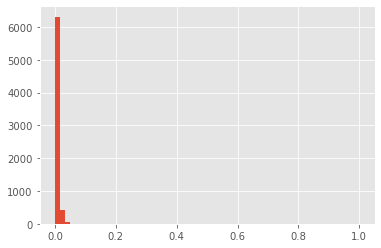

mean :  0.007997499389918405
var  :  0.0003929611066288366
skew :  30.399004296295576
kurt :  1231.7880775738497
shapiro :  ShapiroResult(statistic=0.16802215576171875, pvalue=0.0)
normaltest :  NormaltestResult(statistic=17847.403516984876, pvalue=0.0)


==================== debt_ratio% ====================


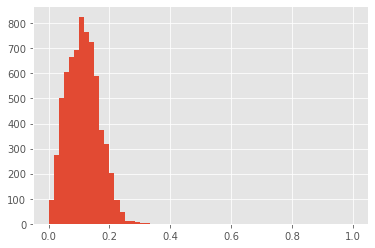

mean :  0.11317708497305978
var  :  0.0029069730385210767
skew :  0.9805803543495488
kurt :  10.720981589684031
shapiro :  ShapiroResult(statistic=0.9635034799575806, pvalue=2.410080617106074e-38)
normaltest :  NormaltestResult(statistic=2027.9165952793278, pvalue=0.0)


==================== net_value/asset ====================


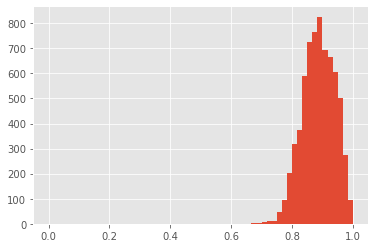

mean :  0.8868229150269449
var  :  0.0029069730385210763
skew :  -0.9805803543495459
kurt :  10.720981589684033
shapiro :  ShapiroResult(statistic=0.9635013937950134, pvalue=2.4053744963434855e-38)
normaltest :  NormaltestResult(statistic=2027.9165952793237, pvalue=0.0)


==================== long-term_fund_suitability_ratio_(a) ====================


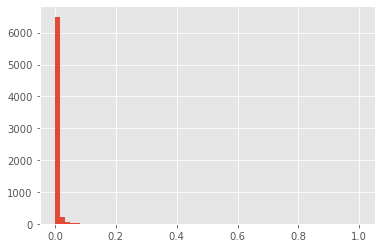

mean :  0.008782733815036855
var  :  0.0007924710129553999
skew :  24.962380108806784
kurt :  740.8420417322072
shapiro :  ShapiroResult(statistic=0.07944971323013306, pvalue=0.0)
normaltest :  NormaltestResult(statistic=16429.254133615716, pvalue=0.0)


==================== borrowing_dependency ====================


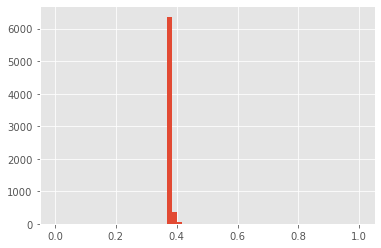

mean :  0.37465429459872174
var  :  0.00026520021977256136
skew :  20.83430660129551
kurt :  802.0571969405268
shapiro :  ShapiroResult(statistic=0.18964779376983643, pvalue=0.0)
normaltest :  NormaltestResult(statistic=15347.97450214678, pvalue=0.0)


==================== contingent_liabilities/net_value ====================


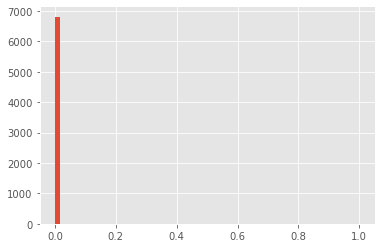

mean :  0.005968277266479204
var  :  0.0001485343795935776
skew :  79.65309354791592
kurt :  6487.125425141201
shapiro :  ShapiroResult(statistic=0.01313716173171997, pvalue=0.0)
normaltest :  NormaltestResult(statistic=25246.235306910145, pvalue=0.0)


==================== pre-tax_net_profit/real_income_capital ====================


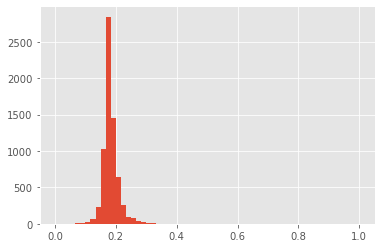

mean :  0.18271502907673587
var  :  0.0009475631771800628
skew :  6.378022179780889
kurt :  120.90819101405971
shapiro :  ShapiroResult(statistic=0.7088561058044434, pvalue=0.0)
normaltest :  NormaltestResult(statistic=8550.987276182761, pvalue=0.0)


==================== inventory_and_accounts_receivable/net_value ====================


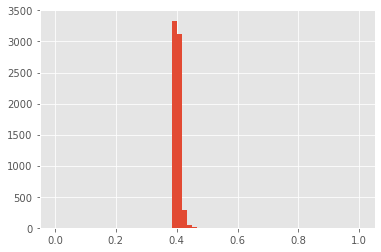

mean :  0.4024593305206683
var  :  0.00017750506209551886
skew :  13.10934971254641
kurt :  778.3825035769572
shapiro :  ShapiroResult(statistic=0.3641258478164673, pvalue=0.0)
normaltest :  NormaltestResult(statistic=12729.995351504604, pvalue=0.0)


==================== total_asset_turnover ====================


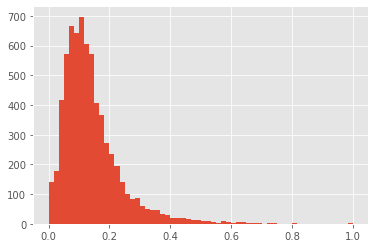

mean :  0.14160561602172933
var  :  0.010228804386783944
skew :  2.3403916532087052
kurt :  9.498384388064911
shapiro :  ShapiroResult(statistic=0.8221862316131592, pvalue=0.0)
normaltest :  NormaltestResult(statistic=3557.591539537223, pvalue=0.0)


==================== accounts_receivable_turnover ====================


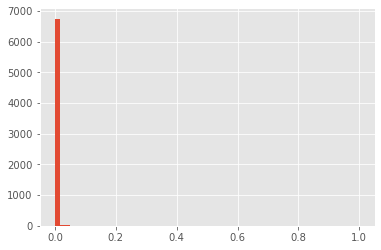

mean :  0.0021819550942975504
var  :  0.00027133855584914366
skew :  40.78818495009052
kurt :  2145.8285759550868
shapiro :  ShapiroResult(statistic=0.04667937755584717, pvalue=0.0)
normaltest :  NormaltestResult(statistic=19987.19998276496, pvalue=0.0)


==================== average_collection_days ====================


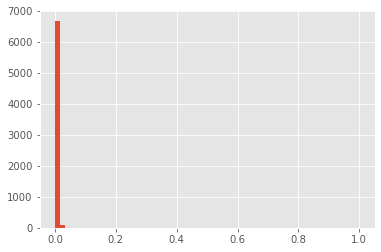

mean :  0.00769414055702364
var  :  0.0003623787583769113
skew :  35.12175284442181
kurt :  1519.4422606923604
shapiro :  ShapiroResult(statistic=0.10280901193618774, pvalue=0.0)
normaltest :  NormaltestResult(statistic=18868.515800782363, pvalue=0.0)


==================== inventory_turnover_rate_(times) ====================


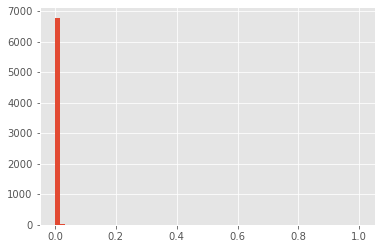

mean :  0.001102016291467157
var  :  0.0003433190129278359
skew :  36.24712174640752
kurt :  1596.6696184460532
shapiro :  ShapiroResult(statistic=0.026931166648864746, pvalue=0.0)
normaltest :  NormaltestResult(statistic=19096.272893710415, pvalue=0.0)


==================== fixed_asset_turnover_times ====================


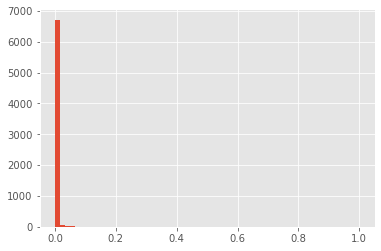

mean :  0.0020112287521023282
var  :  0.00043106064059138423
skew :  34.885737494226426
kurt :  1392.1202691227602
shapiro :  ShapiroResult(statistic=0.04700136184692383, pvalue=0.0)
normaltest :  NormaltestResult(statistic=18799.293039334905, pvalue=0.0)


==================== net_worth_turnover_rate_(times) ====================


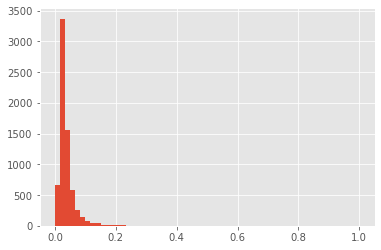

mean :  0.03859505461495224
var  :  0.001345250295071798
skew :  8.959876819939176
kurt :  156.92197023661748
shapiro :  ShapiroResult(statistic=0.5026038885116577, pvalue=0.0)
normaltest :  NormaltestResult(statistic=10186.87763684894, pvalue=0.0)


==================== revenue_per_person ====================


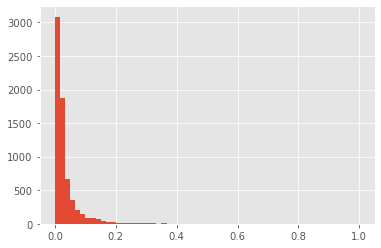

mean :  0.03553266506393268
var  :  0.0031247705461148797
skew :  5.8744915664184445
kurt :  56.67768307452929
shapiro :  ShapiroResult(statistic=0.4966522455215454, pvalue=0.0)
normaltest :  NormaltestResult(statistic=7784.449405836052, pvalue=0.0)


==================== operating_profit_per_person ====================


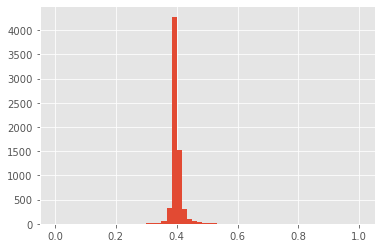

mean :  0.4006710150813339
var  :  0.001070450832479732
skew :  7.786586158022676
kurt :  114.30949424933338
shapiro :  ShapiroResult(statistic=0.40064436197280884, pvalue=0.0)
normaltest :  NormaltestResult(statistic=9382.201430332607, pvalue=0.0)


==================== equipment_rate_per_person ====================


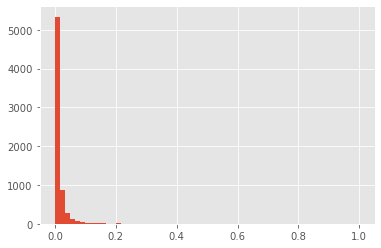

mean :  0.015978894688303966
var  :  0.0015819505055124613
skew :  11.990271523577048
kurt :  198.260453066912
shapiro :  ShapiroResult(statistic=0.27997714281082153, pvalue=0.0)
normaltest :  NormaltestResult(statistic=11730.164409463658, pvalue=0.0)


==================== working_capital_to_total_assets ====================


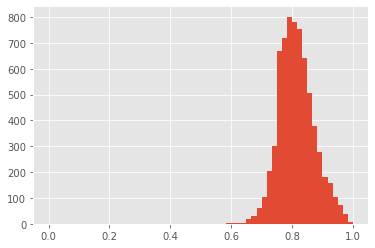

mean :  0.8141251702613354
var  :  0.0034869110448852393
skew :  -0.19226904158493047
kurt :  5.508878311045477
shapiro :  ShapiroResult(statistic=0.9774845838546753, pvalue=1.7199224435157985e-31)
normaltest :  NormaltestResult(statistic=852.8816843449977, pvalue=6.296444596898891e-186)


==================== quick_asset/total_asset ====================


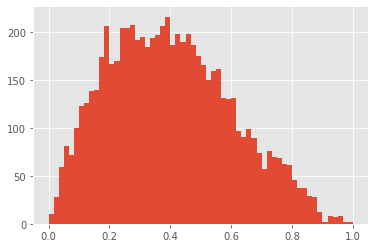

mean :  0.4001318123650555
var  :  0.04079723518867219
skew :  0.33724047067493934
kurt :  -0.5635944901789314
shapiro :  ShapiroResult(statistic=0.9813278317451477, pvalue=5.0284192186706946e-29)
normaltest :  NormaltestResult(statistic=305.15315669849264, pvalue=5.455492401812595e-67)


==================== current_assets/total_assets ====================


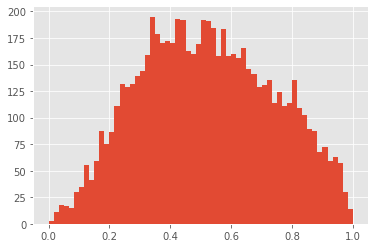

mean :  0.5222734467680338
var  :  0.04756579018230574
skew :  0.0758736104456908
kurt :  -0.8033470119050463
shapiro :  ShapiroResult(statistic=0.9852021932601929, pvalue=4.147793661797148e-26)
normaltest :  NormaltestResult(statistic=591.6634544395722, pvalue=3.3259314707212826e-129)


==================== cash_/_total_assets ====================


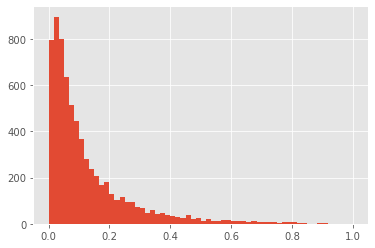

mean :  0.12409456048965208
var  :  0.019387881396528635
skew :  2.2298695957015022
kurt :  5.904654148377487
shapiro :  ShapiroResult(statistic=0.7545865774154663, pvalue=0.0)
normaltest :  NormaltestResult(statistic=3129.0690075527295, pvalue=0.0)


==================== cash_/_current_liability ====================


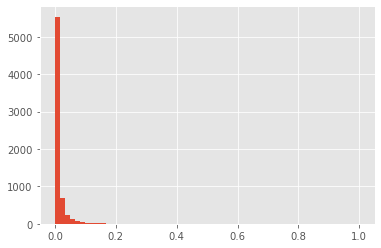

mean :  0.013096481431712043
var  :  0.000991416193975225
skew :  12.18249914890512
kurt :  262.233197681
shapiro :  ShapiroResult(statistic=0.3434848189353943, pvalue=0.0)
normaltest :  NormaltestResult(statistic=11937.854669216382, pvalue=0.0)


==================== current_liability_to_assets ====================


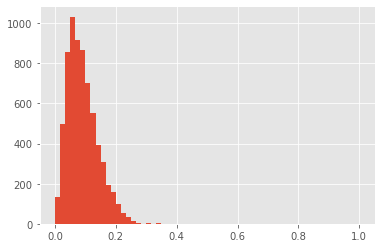

mean :  0.09067279456762405
var  :  0.002528698798066338
skew :  1.607849622730688
kurt :  15.857573579045134
shapiro :  ShapiroResult(statistic=0.9282931089401245, pvalue=0.0)
normaltest :  NormaltestResult(statistic=3066.084536799499, pvalue=0.0)


==================== operating_funds_to_liability ====================


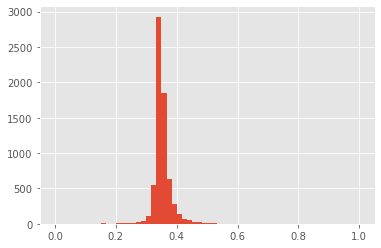

mean :  0.35382800412158644
var  :  0.0012351433965300275
skew :  3.776466331230486
kurt :  60.936147038217904
shapiro :  ShapiroResult(statistic=0.6491320133209229, pvalue=0.0)
normaltest :  NormaltestResult(statistic=6202.655089063983, pvalue=0.0)


==================== inventory/working_capital ====================


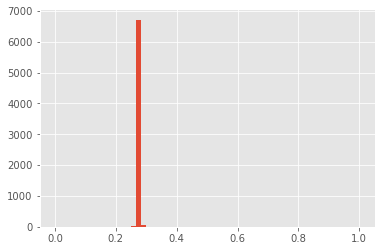

mean :  0.2773951061023301
var  :  0.00010958068468059761
skew :  45.322277137834
kurt :  3438.946228617386
shapiro :  ShapiroResult(statistic=0.045005738735198975, pvalue=0.0)
normaltest :  NormaltestResult(statistic=20839.888758601734, pvalue=0.0)


==================== inventory/current_liability ====================


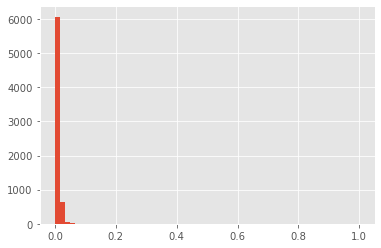

mean :  0.008988860353935172
var  :  0.0006074357888905471
skew :  29.433051558057667
kurt :  1037.3400805837293
shapiro :  ShapiroResult(statistic=0.15688300132751465, pvalue=0.0)
normaltest :  NormaltestResult(statistic=17586.54201418237, pvalue=0.0)


==================== working_capital/equity ====================


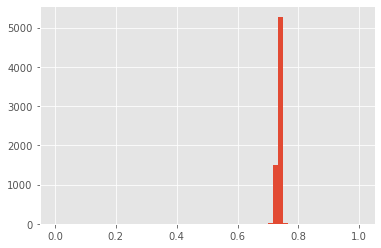

mean :  0.7358165257322217
var  :  0.0001363563029070476
skew :  -36.19568970877101
kurt :  2411.1633988563703
shapiro :  ShapiroResult(statistic=0.1918933391571045, pvalue=0.0)
normaltest :  NormaltestResult(statistic=19187.93780240466, pvalue=0.0)


==================== lo_ng-term_liability_to_current_assets ====================


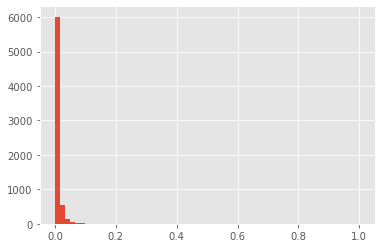

mean :  0.007137052907709761
var  :  0.0003938472299105173
skew :  22.580117603170866
kurt :  967.7478481382706
shapiro :  ShapiroResult(statistic=0.3020874261856079, pvalue=0.0)
normaltest :  NormaltestResult(statistic=15892.996437172758, pvalue=0.0)


==================== retained_earnings/total_assets ====================


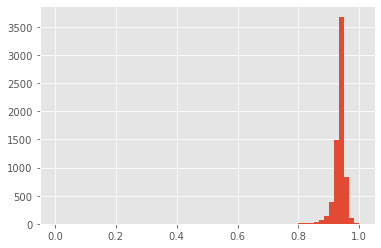

mean :  0.9347327541270049
var  :  0.0006534335911659246
skew :  -11.137123410138619
kurt :  303.40310625679075
shapiro :  ShapiroResult(statistic=0.5618148446083069, pvalue=0.0)
normaltest :  NormaltestResult(statistic=11543.062754841543, pvalue=0.0)


==================== total_income_/_total_expense ====================


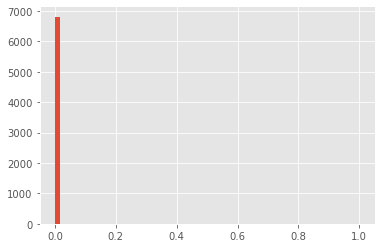

mean :  0.0025489455673864637
var  :  0.00014621472187931363
skew :  82.31431171292114
kurt :  6786.903522565649
shapiro :  ShapiroResult(statistic=0.0057373046875, pvalue=0.0)
normaltest :  NormaltestResult(statistic=25518.672673990324, pvalue=0.0)


==================== total_expense_/assets ====================


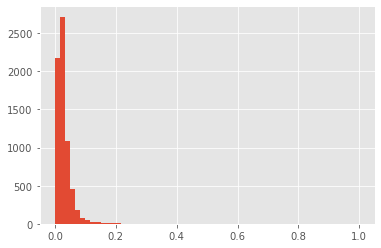

mean :  0.02918409925586065
var  :  0.0007369479927606597
skew :  9.479641694091109
kurt :  259.4729775173601
shapiro :  ShapiroResult(statistic=0.6137514114379883, pvalue=0.0)
normaltest :  NormaltestResult(statistic=10686.92756077741, pvalue=0.0)


==================== working_capitcal_turnover_rate ====================


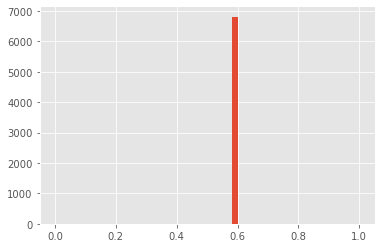

mean :  0.594006265565915
var  :  8.025879326193359e-05
skew :  -28.578322387154248
kurt :  3455.5287419795472
shapiro :  ShapiroResult(statistic=0.009839951992034912, pvalue=0.0)
normaltest :  NormaltestResult(statistic=17695.576975940767, pvalue=0.0)


==================== cash_turnover_rate ====================


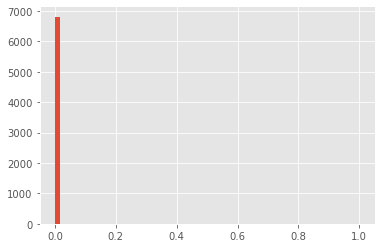

mean :  0.00043839705577619924
var  :  0.00018310689932815325
skew :  64.46052166899213
kurt :  4525.144388068172
shapiro :  ShapiroResult(statistic=0.008443832397460938, pvalue=0.0)
normaltest :  NormaltestResult(statistic=23515.60319716392, pvalue=0.0)


==================== cash_flow_to_sales ====================


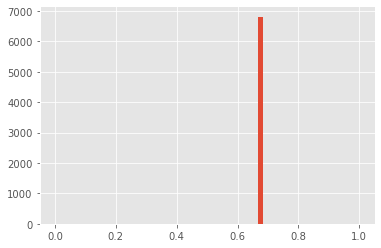

mean :  0.6715307810992104
var  :  8.724794125458128e-05
skew :  -47.85858153198689
kurt :  4150.5174547169645
shapiro :  ShapiroResult(statistic=0.007831156253814697, pvalue=0.0)
normaltest :  NormaltestResult(statistic=21270.581689310497, pvalue=0.0)


==================== fix_assets_to_assets ====================


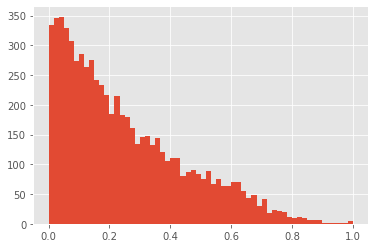

mean :  0.24935316731828436
var  :  0.04003227515950264
skew :  0.8961148477447867
kurt :  0.0611793800632241
shapiro :  ShapiroResult(statistic=0.9150923490524292, pvalue=0.0)
normaltest :  NormaltestResult(statistic=684.9738821392631, pvalue=1.8189106655472561e-149)


==================== equity_to_long-term_liability ====================


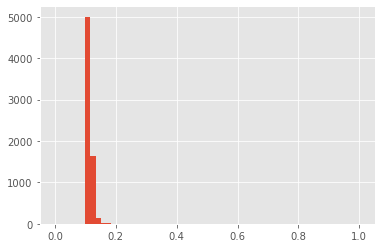

mean :  0.11564465149636462
var  :  0.0003813327956907867
skew :  33.782506281575145
kurt :  1380.1421206137222
shapiro :  ShapiroResult(statistic=0.1402500867843628, pvalue=0.0)
normaltest :  NormaltestResult(statistic=18580.07317553587, pvalue=0.0)


==================== cash_flow_to_total_assets ====================


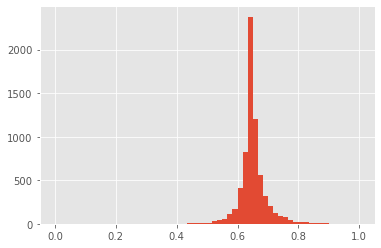

mean :  0.6497305901792364
var  :  0.002243789784180975
skew :  -0.22810748135825765
kurt :  16.548081914512284
shapiro :  ShapiroResult(statistic=0.8350548148155212, pvalue=0.0)
normaltest :  NormaltestResult(statistic=1599.1556467462792, pvalue=0.0)


==================== cash_flow_to_liability ====================


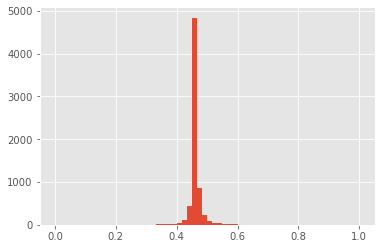

mean :  0.4618492532922564
var  :  0.0008964326259662284
skew :  1.0077409980301602
kurt :  84.79079882915211
shapiro :  ShapiroResult(statistic=0.47152018547058105, pvalue=0.0)
normaltest :  NormaltestResult(statistic=3409.8366882843093, pvalue=0.0)


==================== cfo_to_assets ====================


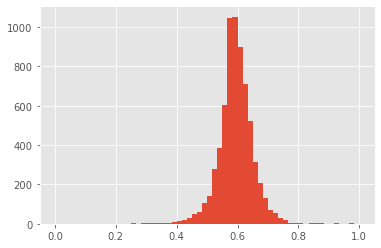

mean :  0.5934150861096202
var  :  0.0034288351237337553
skew :  -0.44366483914735083
kurt :  7.041938066256401
shapiro :  ShapiroResult(statistic=0.9382240772247314, pvalue=0.0)
normaltest :  NormaltestResult(statistic=1169.1551376899467, pvalue=1.3218665297981587e-254)


==================== cash_flow_to_equity ====================


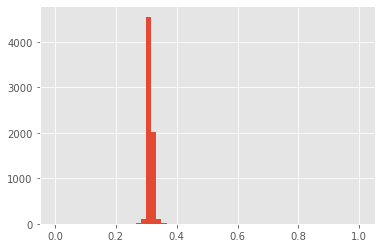

mean :  0.315582389899575
var  :  0.00016796009704258259
skew :  19.939100842656618
kurt :  1248.8217051483527
shapiro :  ShapiroResult(statistic=0.34594088792800903, pvalue=0.0)
normaltest :  NormaltestResult(statistic=15219.44687491511, pvalue=0.0)


==================== current_liabilities_to_current_assets ====================


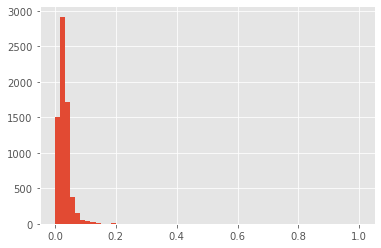

mean :  0.03150636574744067
var  :  0.0009512552846351038
skew :  13.185759211620377
kurt :  310.77036289329345
shapiro :  ShapiroResult(statistic=0.4587339162826538, pvalue=0.0)
normaltest :  NormaltestResult(statistic=12423.261735635991, pvalue=0.0)


==================== net_income_to_total_assets ====================


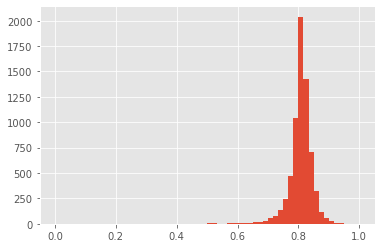

mean :  0.8077602200365478
var  :  0.0016264471217883945
skew :  -3.683286322395278
kurt :  43.70148337013512
shapiro :  ShapiroResult(statistic=0.7897741198539734, pvalue=0.0)
normaltest :  NormaltestResult(statistic=5914.143780906841, pvalue=0.0)


==================== total_assets_to_gnp_price ====================


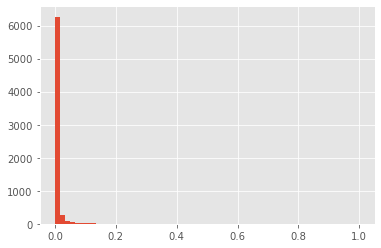

mean :  0.008639262767986806
var  :  0.0011503714686435338
skew :  12.123184096919543
kurt :  208.46540046505478
shapiro :  ShapiroResult(statistic=0.20400208234786987, pvalue=0.0)
normaltest :  NormaltestResult(statistic=11810.124736445141, pvalue=0.0)


==================== no-credit_interval ====================


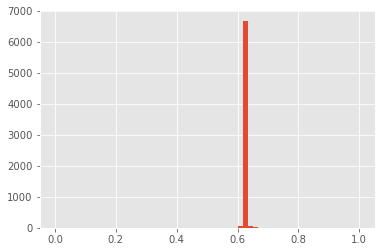

mean :  0.6239145747675325
var  :  0.00015101084137911984
skew :  -11.583016465383388
kurt :  1239.6230800363494
shapiro :  ShapiroResult(statistic=0.08605968952178955, pvalue=0.0)
normaltest :  NormaltestResult(statistic=12229.25955834017, pvalue=0.0)


==================== net_income_to_stockholder's_equity ====================


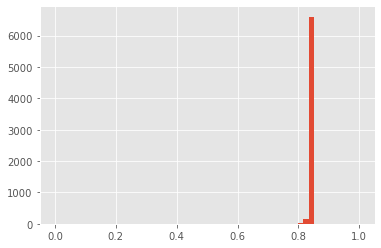

mean :  0.8404020646300984
var  :  0.00021087283497705107
skew :  -37.956349397823175
kurt :  1943.2826325932383
shapiro :  ShapiroResult(statistic=0.1035357117652893, pvalue=0.0)
normaltest :  NormaltestResult(statistic=19462.54498720266, pvalue=0.0)


==================== liability_to_equity ====================


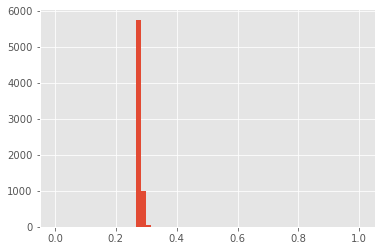

mean :  0.2803651538333943
var  :  0.00020915415943618883
skew :  27.453426415459322
kurt :  1208.3161507974776
shapiro :  ShapiroResult(statistic=0.1730794906616211, pvalue=0.0)
normaltest :  NormaltestResult(statistic=17181.012146174624, pvalue=0.0)


==================== degree_of_financial_leverage_(dfl) ====================


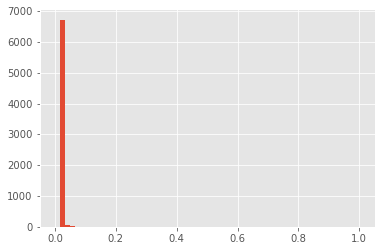

mean :  0.027541119421203828
var  :  0.00024544840227081643
skew :  45.71413838453893
kurt :  2473.6177967785757
shapiro :  ShapiroResult(statistic=0.02762681245803833, pvalue=0.0)
normaltest :  NormaltestResult(statistic=20829.841099329336, pvalue=0.0)


==================== interest_coverage_ratio(_interest_expense_to_ebit_) ====================


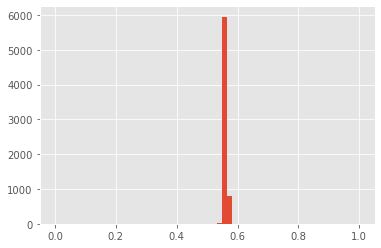

mean :  0.5653579335465504
var  :  0.00017459052519339343
skew :  -13.936461385232546
kurt :  911.1315883364481
shapiro :  ShapiroResult(statistic=0.09129887819290161, pvalue=0.0)
normaltest :  NormaltestResult(statistic=13105.233690031739, pvalue=0.0)


==================== equity_to_liability ====================


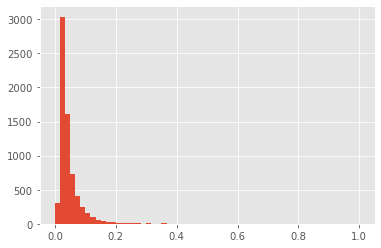

mean :  0.047578356529497635
var  :  0.0025010049823013607
skew :  7.399472689716212
kurt :  93.99633099390667
shapiro :  ShapiroResult(statistic=0.5018379092216492, pvalue=0.0)
normaltest :  NormaltestResult(statistic=9050.33677102964, pvalue=0.0)


==================== one_if_total_liabilities_exceeds_total_assets_zero_otherwise_0 ====================


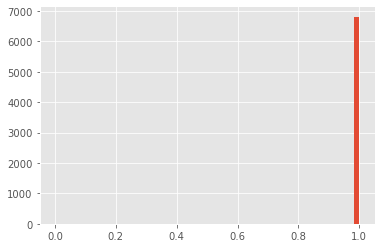

mean :  0.9988268074497727
var  :  0.0011718161694671183
skew :  -29.14405899270978
kurt :  847.3761745705476
shapiro :  ShapiroResult(statistic=0.013024389743804932, pvalue=0.0)
normaltest :  NormaltestResult(statistic=17460.52044601898, pvalue=0.0)


==================== one_if_total_liabilities_exceeds_total_assets_zero_otherwise_1 ====================


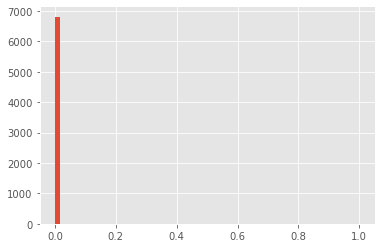

mean :  0.001173192550227306
var  :  0.0011718161694671183
skew :  29.14405899270977
kurt :  847.3761745705474
shapiro :  ShapiroResult(statistic=0.013024985790252686, pvalue=0.0)
normaltest :  NormaltestResult(statistic=17460.520446018767, pvalue=0.0)




['roa(a)_after_tax_and_before_interest%',
 'operating_profit_rate',
 'non-industry_revenue_and_expenditure/revenue',
 'business_expense_rate',
 'research_and_development_expense_ratio',
 'cash_flow_ratio',
 'interest-bearing_debt_interest_rate',
 'tax_rate_(a)',
 'persistent_eps_in_the_last_four_seasons',
 'cash_flow_per_share',
 'turnover_per_share_(rmb)',
 'net_profit_per_share_before_tax_(yuan)',
 'realized_sales_gross_profit_growth_rate',
 'operating_profit_growth_rate',
 'permanent_net_profit_growth_rate',
 'return_on_total_assets_growth_rate',
 'cash_reinvestment_%',
 'current_ratio',
 'interest_expense_ratio',
 'total_debt/total_net_worth',
 'debt_ratio%',
 'net_value/asset',
 'long-term_fund_suitability_ratio_(a)',
 'borrowing_dependency',
 'contingent_liabilities/net_value',
 'pre-tax_net_profit/real_income_capital',
 'inventory_and_accounts_receivable/net_value',
 'total_asset_turnover',
 'accounts_receivable_turnover',
 'average_collection_days',
 'inventory_turnover_rate_(t

In [21]:
analyze_normal(df)

In [22]:
log_columns = [
    'operating_profit_rate',
    'non-industry_revenue_and_expenditure/revenue',
    'business_expense_rate',
    'research_and_development_expense_ratio',
    'interest-bearing_debt_interest_rate',
    'persistent_eps_in_the_last_four_seasons',
    'cash_flow_per_share',
    'net_profit_per_share_before_tax_(yuan)',
    'realized_sales_gross_profit_growth_rate',
    'operating_profit_growth_rate',
    'permanent_net_profit_growth_rate',
    'return_on_total_assets_growth_rate',
    'interest_expense_ratio',
    'long-term_fund_suitability_ratio_(a)',
    'borrowing_dependency',
    'contingent_liabilities/net_value',
    'pre-tax_net_profit/real_income_capital',
    'inventory_and_accounts_receivable/net_value',
    'accounts_receivable_turnover',
    'inventory_turnover_rate_(times)',
    'fixed_asset_turnover_times',
    'revenue_per_person',
    'operating_profit_per_person',
    'equipment_rate_per_person',
    'cash_/_current_liability',
    'operating_funds_to_liability',
    'inventory/working_capital',
    'working_capital/equity',
    'lo_ng-term_liability_to_current_assets',
    'working_capitcal_turnover_rate',
    'cash_turnover_rate',
    'cash_flow_to_sales',
    'equity_to_long-term_liability',
    'cash_flow_to_equity',
    'total_assets_to_gnp_price',
    'no-credit_interval',
    "net_income_to_stockholder's_equity",
    'liability_to_equity',
    'degree_of_financial_leverage_(dfl)',
    'interest_coverage_ratio(_interest_expense_to_ebit_)'
]

black_list = [
    'target',
    'one_if_total_liabilities_exceeds_total_assets_zero_otherwise_0',
    'one_if_total_liabilities_exceeds_total_assets_zero_otherwise_1'
]
number_feats = filter_columns(df, exclude=black_list, dtype='number')
normalize_columns = number_feats
scaler_columns =    number_feats

df_normalize = transform_features(df, log_columns, normalize_columns, scaler_columns)
df_normalize

,target,roa(a)_after_tax_and_before_interest%,operating_profit_rate,non-industry_revenue_and_expenditure/revenue,business_expense_rate,research_and_development_expense_ratio,cash_flow_ratio,interest-bearing_debt_interest_rate,tax_rate_(a),persistent_eps_in_the_last_four_seasons,cash_flow_per_share,turnover_per_share_(rmb),net_profit_per_share_before_tax_(yuan),realized_sales_gross_profit_growth_rate,operating_profit_growth_rate,permanent_net_profit_growth_rate,return_on_total_assets_growth_rate,cash_reinvestment_%,current_ratio,interest_expense_ratio,total_debt/total_net_worth,debt_ratio%,net_value/asset,long-term_fund_suitability_ratio_(a),borrowing_dependency,contingent_liabilities/net_value,pre-tax_net_profit/real_income_capital,inventory_and_accounts_receivable/net_value,total_asset_turnover,accounts_receivable_turnover,average_collection_days,inventory_turnover_rate_(times),fixed_asset_turnover_times,net_worth_turnover_rate_(times),revenue_per_person,operating_profit_per_person,equipment_rate_per_person,working_capital_to_total_assets,quick_asset/total_asset,current_assets/total_assets,cash_/_total_assets,cash_/_current_liability,current_liability_to_assets,operating_funds_to_liability,inventory/working_capital,inventory/current_liability,working_capital/equity,lo_ng-term_liability_to_current_assets,retained_earnings/total_assets,total_income_/_total_expense,total_expense_/assets,working_capitcal_turnover_rate,cash_turnover_rate,cash_flow_to_sales,fix_assets_to_assets,equity_to_long-term_liability,cash_flow_to_total_assets,cash_flow_to_liability,cfo_to_assets,cash_flow_to_equity,current_liabilities_to_current_assets,net_income_to_total_assets,total_assets_to_gnp_price,no-credit_interval,net_income_to_stockholder's_equity,liability_to_equity,degree_of_financial_leverage_(dfl),interest_coverage_ratio(_interest_expense_to_ebit_),equity_to_liability,one_if_total_liabilities_exceeds_total_assets_zero_otherwise_0,one_if_total_liabilities_exceeds_total_assets_zero_otherwise_1
0,0.00,-1.18,-1.94,-0.01,1.53,0.79,-0.86,2.19,-1.05,-0.64,-0.42,-1.78,-0.62,0.69,0.00,0.02,2.03,-0.35,2.29,-0.05,-1.60,-1.95,1.93,2.20,-0.48,-0.46,-0.64,-0.82,-1.46,-1.29,1.63,-0.13,1.45,-1.59,-0.51,-0.83,-2.05,2.61,2.00,1.47,2.02,2.52,-1.67,-1.06,-0.05,-0.23,0.72,0.03,-2.68,-1.03,0.59,0.56,2.52,0.03,-1.61,-0.55,0.76,1.40,-0.83,0.30,-2.09,-1.14,-1.25,0.09,-0.27,-0.60,-0.09,-0.03,2.11,1,0
1,0.00,-0.19,-0.24,-0.00,-0.13,0.20,-0.49,1.18,0.03,-0.22,-0.70,0.90,-0.27,0.17,0.04,0.02,0.50,-0.71,-0.42,0.11,0.61,0.67,-0.66,0.03,-0.18,-0.46,-0.26,0.99,1.23,-0.19,0.15,-0.01,0.79,1.30,0.24,-0.20,-0.73,0.08,0.44,1.01,-0.02,-0.35,1.25,-0.56,0.03,0.48,0.21,-3.12,-0.23,-0.34,0.73,-0.05,-0.45,-0.01,-0.63,-0.54,-1.25,-0.39,-1.04,-0.94,0.31,-0.22,0.87,-0.02,0.01,0.14,0.04,0.09,-0.73,1,0
2,0.00,-0.04,0.25,-0.01,-0.50,0.03,-0.11,0.90,0.41,-0.14,0.23,-0.52,-0.12,-0.07,-0.02,0.01,-0.09,0.26,-1.53,0.27,0.96,0.94,-0.94,-1.11,0.52,0.04,-0.16,-0.55,-0.77,-0.26,0.24,0.67,-1.18,-0.25,-0.48,-0.11,0.98,-1.51,-0.97,-1.41,-1.28,-1.29,0.35,-0.15,-0.07,-1.24,-0.84,1.62,-0.21,-0.02,-0.92,-0.14,-0.96,-0.00,1.46,1.19,-0.22,-0.10,0.12,-0.14,1.80,-0.17,0.60,0.39,0.04,0.33,0.17,0.16,-0.95,1,0
3,0.00,-0.31,-0.16,-0.01,-0.63,-0.70,-0.47,1.25,1.92,-0.10,-0.71,1.31,-0.16,-0.06,-0.02,0.01,-0.32,-0.53,0.02,0.01,0.62,0.68,-0.68,-0.30,-0.37,-0.46,-0.16,0.79,1.45,-0.24,0.21,0.35,0.93,1.55,1.02,-0.01,0.22,0.73,1.30,1.29,1.30,0.50,0.90,-0.50,-0.02,-0.06,0.62,-0.95,-0.30,-0.37,0.29,-0.03,0.41,-0.00,-0.25,-0.18,0.05,-0.03,-0.90,0.08,-0.14,-0.31,-0.41,0.02,-0.03,0.15,-0.07,-0.00,-0.74,1,0
4,0.00,-1.17,-0.96,-0.00,-1.94,0.03,-0.27,-0.28,-1.05,-0.96,-0.25,-0.48,-0.84,-0.49,-0.57,-0.02,-0.78,-0.07,-1.15,-0.09,0.57,0.63,-0.63,-1.24,0.13,-0.46,-0.91,0.05,0.20,1.36,-1.47,-0.27,-0.80,0.33,0.16,-0.62,1.01,-1.16,-1.62,-0.72,-1.35,-1.58,0.72,-0.26,-1.05,0.70,-0.58,-0.64,-1.81,-3.86,-1.50,-0.10,-1.75,-0.00,1.60,-0.30,-0.16,-0.09,-0.25,-0.08,1.23,-1.22,0.48,0.09,-0.46,0.12,-0.12,-0.07,-0.70,1,0
...,...,...,...,...,...,...,.

==================== target ====================


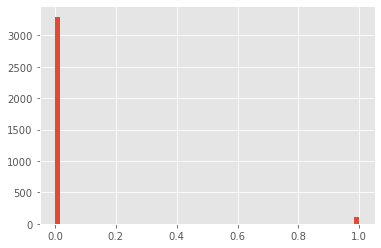

mean :  0.03226752713405691
var  :  0.03122633382670816
skew :  nan
kurt :  nan
shapiro :  ShapiroResult(statistic=nan, pvalue=1.0)
normaltest :  NormaltestResult(statistic=nan, pvalue=nan)


==================== roa(a)_after_tax_and_before_interest% ====================


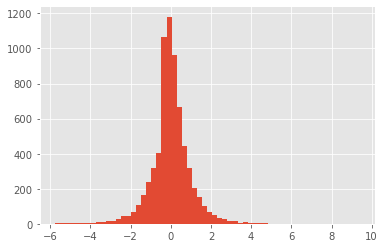

mean :  -4.237212819455888e-16
var  :  0.999999999999998
skew :  0.310652481258768
kurt :  7.506157018715093
shapiro :  ShapiroResult(statistic=0.918506920337677, pvalue=0.0)
normaltest :  NormaltestResult(statistic=1110.1414423106844, pvalue=8.626780265537355e-242)


==================== operating_profit_rate ====================


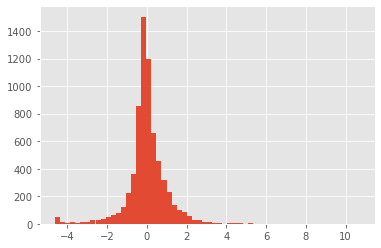

mean :  -6.93706225571438e-17
var  :  1.0000000000000007
skew :  -0.2866840852652385
kurt :  7.868777832981248
shapiro :  ShapiroResult(statistic=0.8753170967102051, pvalue=0.0)
normaltest :  NormaltestResult(statistic=1125.8448034785479, pvalue=3.356658698637243e-245)


==================== non-industry_revenue_and_expenditure/revenue ====================


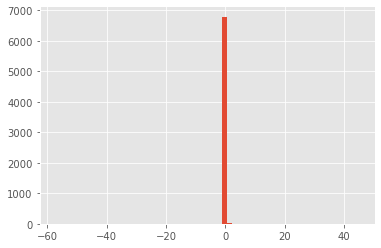

mean :  1.5162343037105603e-15
var  :  1.0000000000000002
skew :  -8.750515247855375
kurt :  2375.764069055773
shapiro :  ShapiroResult(statistic=0.02000272274017334, pvalue=0.0)
normaltest :  NormaltestResult(statistic=11030.917293326012, pvalue=0.0)


==================== business_expense_rate ====================


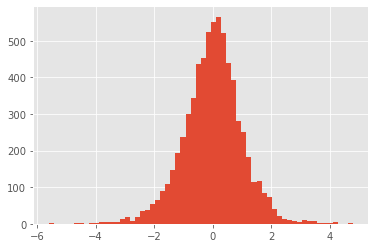

mean :  2.889933815382978e-16
var  :  1.0000000000000029
skew :  -0.11973651684609621
kurt :  1.4737610657580928
shapiro :  ShapiroResult(statistic=0.9872346520423889, pvalue=2.430981572875979e-24)
normaltest :  NormaltestResult(statistic=238.36672997453746, pvalue=1.735090977149767e-52)


==================== research_and_development_expense_ratio ====================


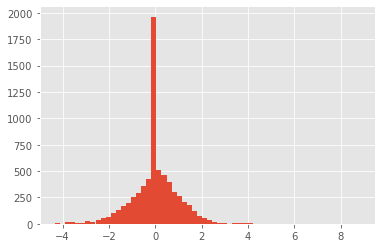

mean :  4.0944256670000643e-16
var  :  0.9999999999999748
skew :  -0.1296691265079121
kurt :  2.9397205279744796
shapiro :  ShapiroResult(statistic=0.9502907991409302, pvalue=4.245934346904196e-43)
normaltest :  NormaltestResult(statistic=494.7187299675446, pvalue=3.742766558848993e-108)


==================== cash_flow_ratio ====================


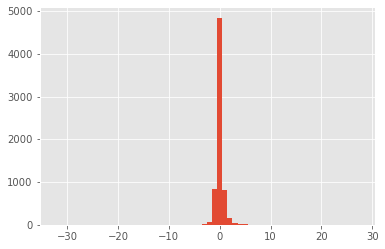

mean :  -3.2373689852610914e-15
var  :  0.9999999999999999
skew :  0.14392181463678866
kurt :  273.424948888114
shapiro :  ShapiroResult(statistic=0.5568486452102661, pvalue=0.0)
normaltest :  NormaltestResult(statistic=3196.4538318606155, pvalue=0.0)


==================== interest-bearing_debt_interest_rate ====================


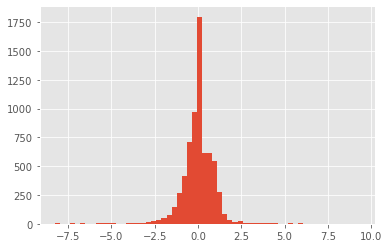

mean :  -7.402952149388655e-16
var  :  0.9999999999999816
skew :  -0.6211663295968672
kurt :  15.984391026891526
shapiro :  ShapiroResult(statistic=0.8356118202209473, pvalue=0.0)
normaltest :  NormaltestResult(statistic=1891.489991627097, pvalue=0.0)


==================== tax_rate_(a) ====================


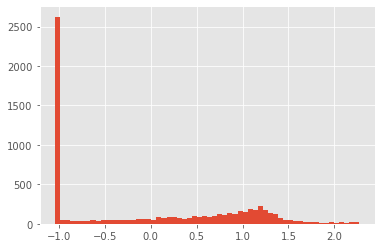

mean :  3.4503367558082294e-16
var  :  1.0000000000000453
skew :  0.26028580073606633
kurt :  -1.4454677472209887
shapiro :  ShapiroResult(statistic=0.8456788063049316, pvalue=0.0)
normaltest :  NormaltestResult(statistic=50703.54673958153, pvalue=0.0)


==================== persistent_eps_in_the_last_four_seasons ====================


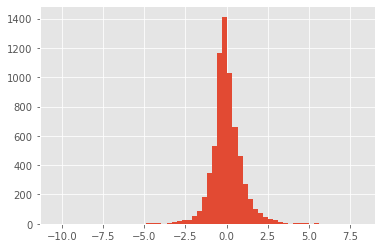

mean :  2.6873942285471235e-16
var  :  1.0000000000000002
skew :  -0.404592230964437
kurt :  11.946874793187302
shapiro :  ShapiroResult(statistic=0.8882989287376404, pvalue=0.0)
normaltest :  NormaltestResult(statistic=1489.4966925602525, pvalue=0.0)


==================== cash_flow_per_share ====================


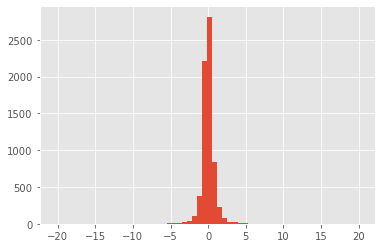

mean :  2.001828661610567e-15
var  :  0.9999999999999959
skew :  -0.832081512052805
kurt :  69.46534687327149
shapiro :  ShapiroResult(statistic=0.7305256128311157, pvalue=0.0)
normaltest :  NormaltestResult(statistic=3084.971716382166, pvalue=0.0)


==================== turnover_per_share_(rmb) ====================


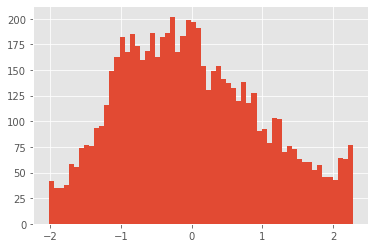

mean :  5.794520816308743e-17
var  :  1.0000000000000009
skew :  0.3094064549120314
kurt :  -0.6055843548674305
shapiro :  ShapiroResult(statistic=0.9806569218635559, pvalue=1.7556076214163664e-29)
normaltest :  NormaltestResult(statistic=330.06451617474045, pvalue=2.12520572233483e-72)


==================== net_profit_per_share_before_tax_(yuan) ====================


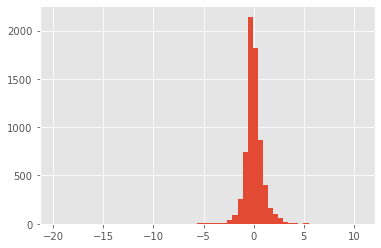

mean :  -7.922488983466801e-17
var  :  0.9999999999999979
skew :  -0.5641176810152558
kurt :  33.11675754026614
shapiro :  ShapiroResult(statistic=0.8457781076431274, pvalue=0.0)
normaltest :  NormaltestResult(statistic=2329.2151534442214, pvalue=0.0)


==================== realized_sales_gross_profit_growth_rate ====================


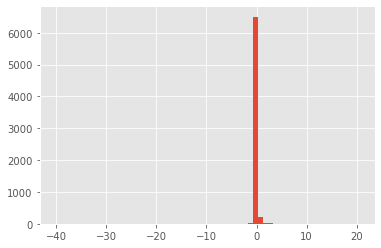

mean :  6.593302593209916e-16
var  :  0.9999999999999988
skew :  -6.849543655670181
kurt :  545.2521622536859
shapiro :  ShapiroResult(statistic=0.12450087070465088, pvalue=0.0)
normaltest :  NormaltestResult(statistic=9510.661080255872, pvalue=0.0)


==================== operating_profit_growth_rate ====================


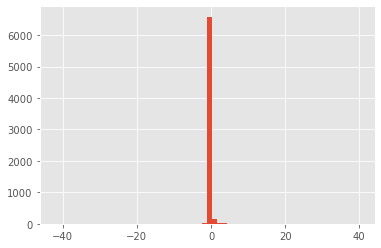

mean :  -4.3488090383521626e-15
var  :  1.0000000000000038
skew :  -2.676809556245164
kurt :  981.2319050192427
shapiro :  ShapiroResult(statistic=0.08913499116897583, pvalue=0.0)
normaltest :  NormaltestResult(statistic=6391.148606511293, pvalue=0.0)


==================== permanent_net_profit_growth_rate ====================


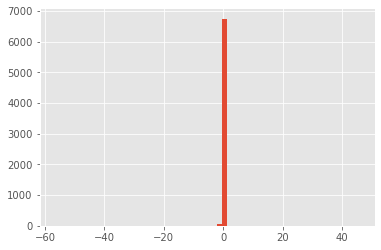

mean :  -2.071978116243045e-15
var  :  1.0000000000000013
skew :  -16.85750899434203
kurt :  2254.346756309784
shapiro :  ShapiroResult(statistic=0.02535003423690796, pvalue=0.0)
normaltest :  NormaltestResult(statistic=14399.77363060111, pvalue=0.0)


==================== return_on_total_assets_growth_rate ====================


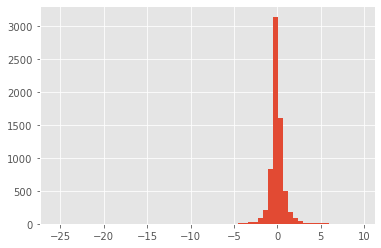

mean :  7.329034968983931e-16
var  :  0.9999999999999987
skew :  -1.8418319561672973
kurt :  81.67895155738701
shapiro :  ShapiroResult(statistic=0.7249091863632202, pvalue=0.0)
normaltest :  NormaltestResult(statistic=4402.950213718994, pvalue=0.0)


==================== cash_reinvestment_% ====================


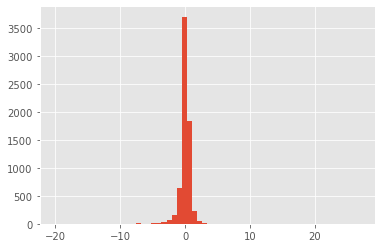

mean :  1.150704484851764e-15
var  :  0.9999999999999989
skew :  0.3020218138527503
kurt :  146.85208674741324
shapiro :  ShapiroResult(statistic=0.6289244294166565, pvalue=0.0)
normaltest :  NormaltestResult(statistic=2983.725182707734, pvalue=0.0)


==================== current_ratio ====================


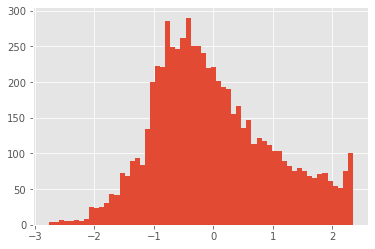

mean :  1.0918251361103241e-16
var  :  1.0000000000000004
skew :  0.40729250457012406
kurt :  -0.32120495928390724
shapiro :  ShapiroResult(statistic=0.9764997959136963, pvalue=4.5354242535834295e-32)
normaltest :  NormaltestResult(statistic=216.69740464418757, pvalue=8.805549446256495e-48)


==================== interest_expense_ratio ====================


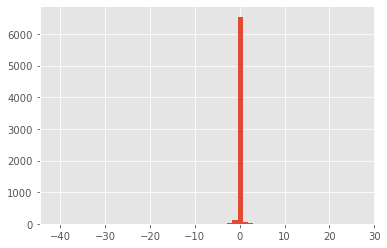

mean :  7.449516716780178e-17
var  :  1.0000000000000016
skew :  -6.154431969377703
kurt :  680.4837330408666
shapiro :  ShapiroResult(statistic=0.14886128902435303, pvalue=0.0)
normaltest :  NormaltestResult(statistic=9139.331720688258, pvalue=0.0)


==================== total_debt/total_net_worth ====================


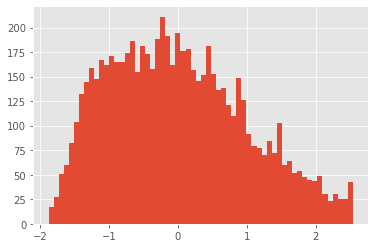

mean :  3.226957082867078e-17
var  :  1.0000000000000004
skew :  0.3976731333027842
kurt :  -0.5650907262665474
shapiro :  ShapiroResult(statistic=0.9750013947486877, pvalue=6.471027340983582e-33)
normaltest :  NormaltestResult(statistic=351.25991205186074, pvalue=5.307368481863745e-77)


==================== debt_ratio% ====================


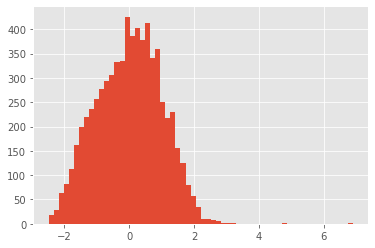

mean :  1.1408319010923114e-16
var  :  0.9999999999999999
skew :  -0.001472798209445434
kurt :  -0.1966927691437803
shapiro :  ShapiroResult(statistic=0.9917762279510498, pvalue=1.810625207093155e-19)
normaltest :  NormaltestResult(statistic=13.280866457310232, pvalue=0.0013064611248196848)


==================== net_value/asset ====================


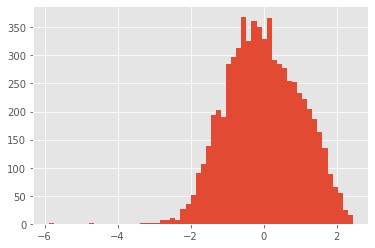

mean :  5.342551448900115e-16
var  :  1.0000000000000013
skew :  -0.005966986953779649
kurt :  -0.3644798931563571
shapiro :  ShapiroResult(statistic=0.9924684762954712, pvalue=1.4528003674864574e-18)
normaltest :  NormaltestResult(statistic=56.7884702323607, pvalue=4.661657598598385e-13)


==================== long-term_fund_suitability_ratio_(a) ====================


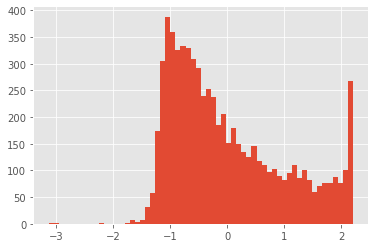

mean :  -1.0530756010082875e-16
var  :  1.000000000000007
skew :  0.737186767121863
kurt :  -0.5470293580933543
shapiro :  ShapiroResult(statistic=0.911691427230835, pvalue=0.0)
normaltest :  NormaltestResult(statistic=666.9524806937309, pvalue=1.4897348293962104e-145)


==================== borrowing_dependency ====================


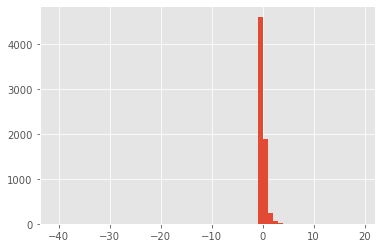

mean :  -1.187152248724788e-16
var  :  0.9999999999999616
skew :  -6.288714625676568
kurt :  508.02365134678104
shapiro :  ShapiroResult(statistic=0.37178462743759155, pvalue=0.0)
normaltest :  NormaltestResult(statistic=9126.190400306135, pvalue=0.0)


==================== contingent_liabilities/net_value ====================


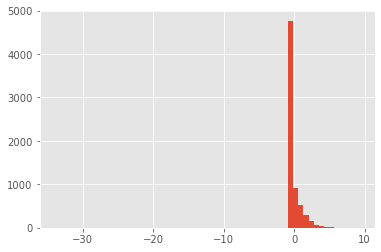

mean :  1.0962536544076997e-15
var  :  1.0000000000000455
skew :  -3.3719576996503386
kurt :  204.2473891350518
shapiro :  ShapiroResult(statistic=0.508556604385376, pvalue=0.0)
normaltest :  NormaltestResult(statistic=6480.391556479337, pvalue=0.0)


==================== pre-tax_net_profit/real_income_capital ====================


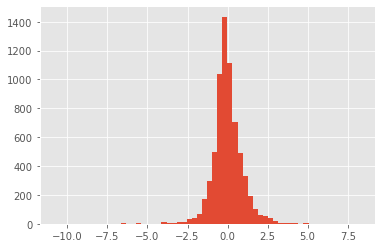

mean :  -1.2670772352020559e-15
var  :  0.9999999999999991
skew :  -0.39045149003583424
kurt :  11.38413324266147
shapiro :  ShapiroResult(statistic=0.8915376663208008, pvalue=0.0)
normaltest :  NormaltestResult(statistic=1445.3465131657008, pvalue=0.0)


==================== inventory_and_accounts_receivable/net_value ====================


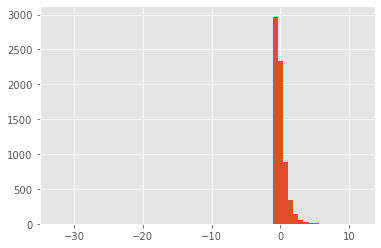

mean :  1.01472495817936e-15
var  :  0.9999999999999966
skew :  -2.948147895916654
kurt :  183.4429548588238
shapiro :  ShapiroResult(statistic=0.6841685771942139, pvalue=0.0)
normaltest :  NormaltestResult(statistic=6022.1841690970705, pvalue=0.0)


==================== total_asset_turnover ====================


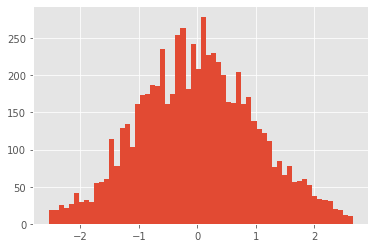

mean :  3.848140215825014e-17
var  :  1.0000000000000027
skew :  0.07290460145841603
kurt :  -0.30704850122530347
shapiro :  ShapiroResult(statistic=0.9968867897987366, pvalue=9.132363615327321e-11)
normaltest :  NormaltestResult(statistic=43.33806991382508, pvalue=3.883807446147092e-10)


==================== accounts_receivable_turnover ====================


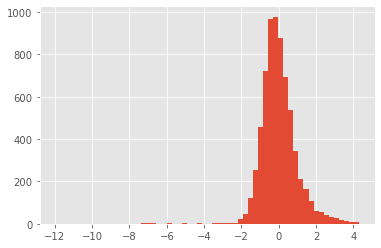

mean :  5.718324251486252e-16
var  :  1.0000000000000024
skew :  -0.6127994497128026
kurt :  12.457076222119218
shapiro :  ShapiroResult(statistic=0.90102618932724, pvalue=0.0)
normaltest :  NormaltestResult(statistic=1710.686060667961, pvalue=0.0)


==================== average_collection_days ====================


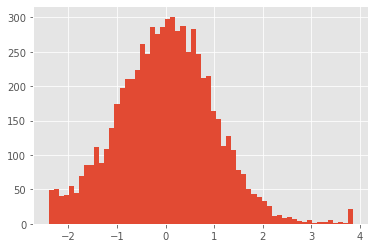

mean :  -4.667528034895731e-16
var  :  0.9999999999999969
skew :  0.15819365327765395
kurt :  0.4401823833305576
shapiro :  ShapiroResult(statistic=0.9932188391685486, pvalue=1.6262562748694636e-17)
normaltest :  NormaltestResult(statistic=66.27022924339258, pvalue=4.070076409920006e-15)


==================== inventory_turnover_rate_(times) ====================


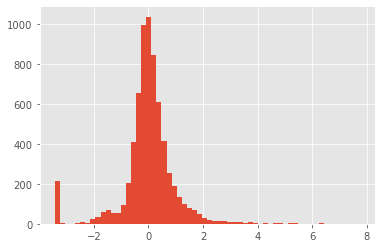

mean :  1.0640329275308383e-15
var  :  1.0000000000000082
skew :  -0.2537611128828216
kurt :  6.7900293849717865
shapiro :  ShapiroResult(statistic=0.8493907451629639, pvalue=0.0)
normaltest :  NormaltestResult(statistic=1011.9375018623608, pvalue=1.8220632767388716e-220)


==================== fixed_asset_turnover_times ====================


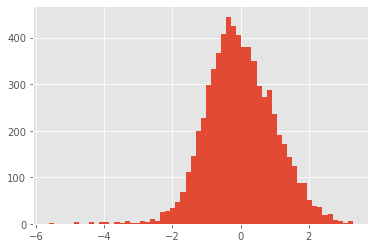

mean :  1.6473436813546465e-16
var  :  0.9999999999999951
skew :  -0.038377988716812896
kurt :  0.7784865563806291
shapiro :  ShapiroResult(statistic=0.991933286190033, pvalue=2.8716027329175846e-19)
normaltest :  NormaltestResult(statistic=94.8043652912712, pvalue=2.591156515790641e-21)


==================== net_worth_turnover_rate_(times) ====================


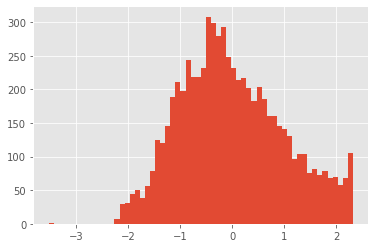

mean :  -1.7232146198317432e-16
var  :  1.0000000000000075
skew :  0.3191281226617981
kurt :  -0.4668195365090284
shapiro :  ShapiroResult(statistic=0.9834753274917603, pvalue=1.7948473005123518e-27)
normaltest :  NormaltestResult(statistic=218.17722963914304, pvalue=4.2016178106887515e-48)


==================== revenue_per_person ====================


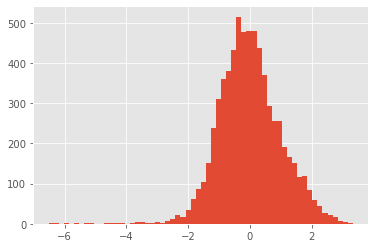

mean :  4.908491530488227e-16
var  :  0.9999999999999988
skew :  -0.0801457267738332
kurt :  1.4948704788201255
shapiro :  ShapiroResult(statistic=0.9849254488945007, pvalue=2.462740700000797e-26)
normaltest :  NormaltestResult(statistic=233.3900846038305, pvalue=2.0892338937866172e-51)


==================== operating_profit_per_person ====================


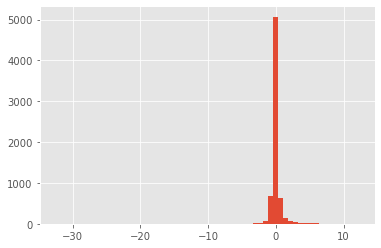

mean :  1.0429771139717168e-15
var  :  1.0000000000000044
skew :  -2.3844241935365877
kurt :  221.82858665358265
shapiro :  ShapiroResult(statistic=0.4627588987350464, pvalue=0.0)
normaltest :  NormaltestResult(statistic=5525.636788070919, pvalue=0.0)


==================== equipment_rate_per_person ====================


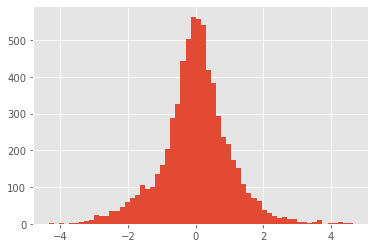

mean :  1.2409620023013555e-16
var  :  1.0000000000000024
skew :  -0.08797948755423528
kurt :  1.4379345233148477
shapiro :  ShapiroResult(statistic=0.9804084300994873, pvalue=1.197490351578151e-29)
normaltest :  NormaltestResult(statistic=224.23007287150793, pvalue=2.0373157262820535e-49)


==================== working_capital_to_total_assets ====================


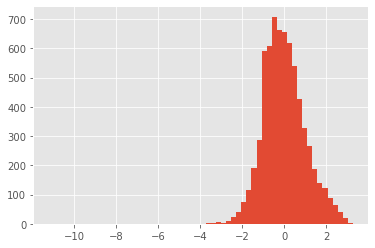

mean :  -1.982087564420979e-16
var  :  1.000000000000001
skew :  0.07551410955075029
kurt :  2.543850746913784
shapiro :  ShapiroResult(statistic=0.9821187853813171, pvalue=1.8055322394731907e-28)
normaltest :  NormaltestResult(statistic=418.4701853314691, pvalue=1.3500623772099285e-91)


==================== quick_asset/total_asset ====================


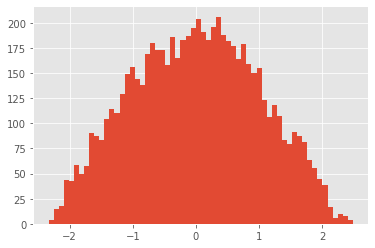

mean :  3.353951357571231e-16
var  :  1.0000000000000004
skew :  0.00680867921870845
kurt :  -0.7292246171175365
shapiro :  ShapiroResult(statistic=0.9892601370811462, pvalue=2.3424582132216734e-22)
normaltest :  NormaltestResult(statistic=411.8928046506829, pvalue=3.6192109921894626e-90)


==================== current_assets/total_assets ====================


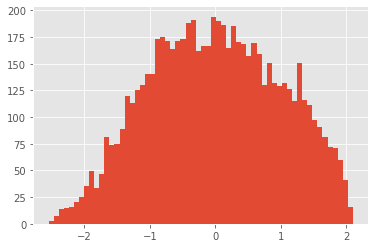

mean :  -5.612170062887395e-17
var  :  0.9999999999999979
skew :  -0.023359552788674114
kurt :  -0.782862100554627
shapiro :  ShapiroResult(statistic=0.9863179922103882, pvalue=3.6656911803326417e-25)
normaltest :  NormaltestResult(statistic=531.6411682046012, pvalue=3.594075103335345e-116)


==================== cash_/_total_assets ====================


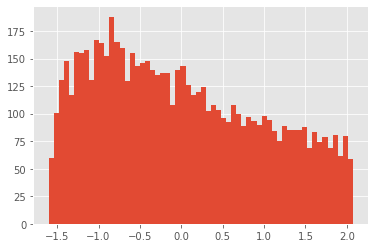

mean :  9.089147124078274e-17
var  :  1.0000000000000002
skew :  0.3407396289536039
kurt :  -1.001105151667673
shapiro :  ShapiroResult(statistic=0.9526834487915039, pvalue=2.5475606081425174e-42)
normaltest :  NormaltestResult(statistic=1685.0211445287446, pvalue=0.0)


==================== cash_/_current_liability ====================


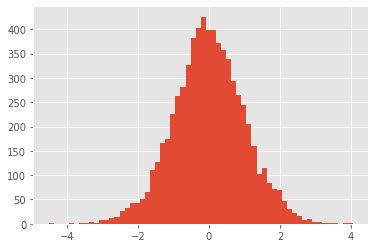

mean :  -1.673515898865791e-16
var  :  1.0000000000000038
skew :  -0.01953962768106214
kurt :  0.3112120442564881
shapiro :  ShapiroResult(statistic=0.9988310933113098, pvalue=7.81703638494946e-05)
normaltest :  NormaltestResult(statistic=21.661080323460542, pvalue=1.9785916490058413e-05)


==================== current_liability_to_assets ====================


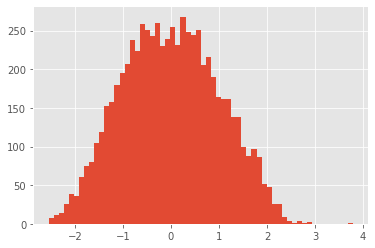

mean :  1.3530588717036754e-16
var  :  1.0000000000000038
skew :  0.0579153992911629
kurt :  -0.5978756528204627
shapiro :  ShapiroResult(statistic=0.9932856559753418, pvalue=2.0347445311277504e-17)
normaltest :  NormaltestResult(statistic=221.0881514851687, pvalue=9.802072217839256e-49)


==================== operating_funds_to_liability ====================


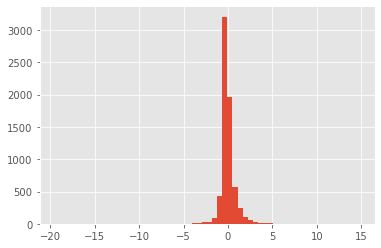

mean :  9.506864670280639e-16
var  :  1.0000000000000004
skew :  -0.0030899217288318757
kurt :  67.17117995837381
shapiro :  ShapiroResult(statistic=0.6520984768867493, pvalue=0.0)
normaltest :  NormaltestResult(statistic=2456.801088137916, pvalue=0.0)


==================== inventory/working_capital ====================


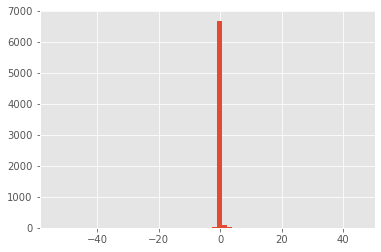

mean :  3.793638506264482e-15
var  :  0.9999999999999948
skew :  -9.111717397483059
kurt :  1893.586838363084
shapiro :  ShapiroResult(statistic=0.07325071096420288, pvalue=0.0)
normaltest :  NormaltestResult(statistic=11165.822568094203, pvalue=0.0)


==================== inventory/current_liability ====================


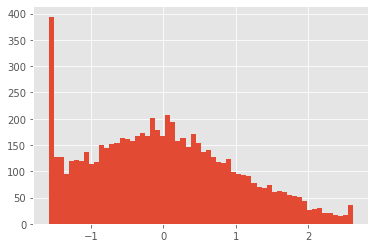

mean :  -4.391478300586895e-17
var  :  0.9999999999999951
skew :  0.3352127469688133
kurt :  -0.5650110013396401
shapiro :  ShapiroResult(statistic=0.9749822616577148, pvalue=6.315859882623132e-33)
normaltest :  NormaltestResult(statistic=305.0972873104427, pvalue=5.6100384614229046e-67)


==================== working_capital/equity ====================


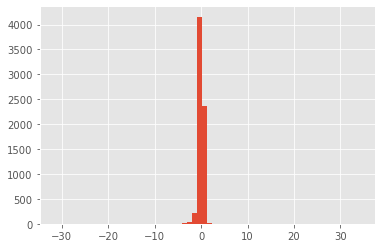

mean :  1.6850349308341484e-16
var  :  1.0000000000000002
skew :  0.0847516966068089
kurt :  585.2826213547477
shapiro :  ShapiroResult(statistic=0.3862636685371399, pvalue=0.0)
normaltest :  NormaltestResult(statistic=3476.9719737891146, pvalue=0.0)


==================== lo_ng-term_liability_to_current_assets ====================


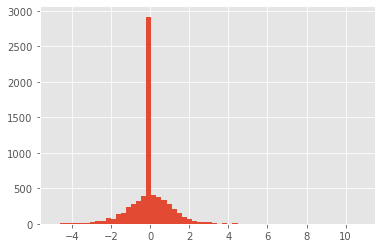

mean :  -6.192110584036362e-16
var  :  0.9999999999999587
skew :  0.037731536839157
kurt :  5.505049684939975
shapiro :  ShapiroResult(statistic=0.8912785649299622, pvalue=0.0)
normaltest :  NormaltestResult(statistic=812.7322795296482, pvalue=3.291757758228295e-177)


==================== retained_earnings/total_assets ====================


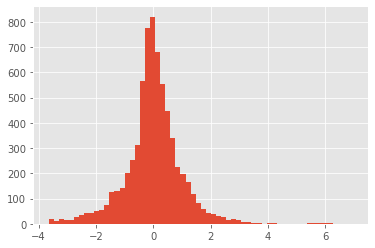

mean :  -1.9955196511685337e-16
var  :  1.0000000000000022
skew :  0.2859156155198238
kurt :  4.261676869709565
shapiro :  ShapiroResult(statistic=0.9424050450325012, pvalue=1.401298464324817e-45)
normaltest :  NormaltestResult(statistic=753.1655955476008, pvalue=2.832493664563084e-164)


==================== total_income_/_total_expense ====================


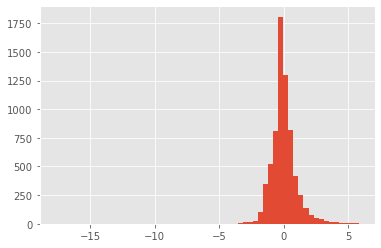

mean :  -1.0363058442204313e-15
var  :  1.0000000000000024
skew :  -0.09637181736574055
kurt :  19.77833066809078
shapiro :  ShapiroResult(statistic=0.8953103423118591, pvalue=0.0)
normaltest :  NormaltestResult(statistic=1674.9851713076835, pvalue=0.0)


==================== total_expense_/assets ====================


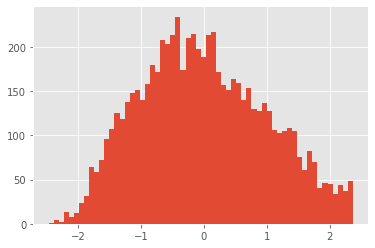

mean :  -1.753497869953503e-16
var  :  0.9999999999999992
skew :  0.22919459718651927
kurt :  -0.6353937464468613
shapiro :  ShapiroResult(statistic=0.9861823916435242, pvalue=2.7933719960866743e-25)
normaltest :  NormaltestResult(statistic=320.24629107415103, pvalue=2.8800595542920776e-70)


==================== working_capitcal_turnover_rate ====================


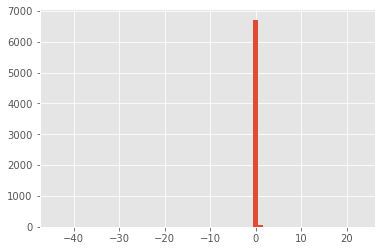

mean :  -2.170075723946983e-16
var  :  1.0000000000000018
skew :  -15.377447158457604
kurt :  1217.5772114417446
shapiro :  ShapiroResult(statistic=0.05976611375808716, pvalue=0.0)
normaltest :  NormaltestResult(statistic=13726.604072173937, pvalue=0.0)


==================== cash_turnover_rate ====================


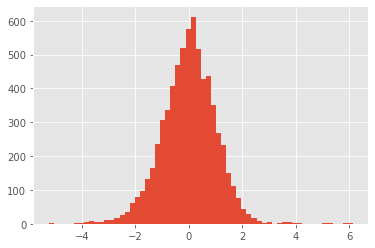

mean :  -1.3603244095353073e-16
var  :  1.0000000000000013
skew :  -0.09872577960645709
kurt :  1.3198558465447672
shapiro :  ShapiroResult(statistic=0.9900251030921936, pvalue=1.5511884170969297e-21)
normaltest :  NormaltestResult(statistic=204.33099403417526, pvalue=4.266663617652136e-45)


==================== cash_flow_to_sales ====================


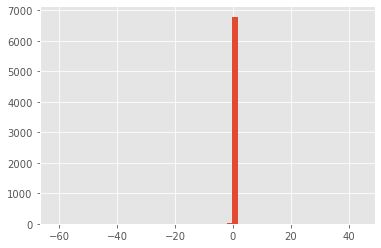

mean :  -1.6676828625583157e-15
var  :  1.0000000000000004
skew :  -17.726637254982016
kurt :  2742.052540784609
shapiro :  ShapiroResult(statistic=0.012992918491363525, pvalue=0.0)
normaltest :  NormaltestResult(statistic=14731.115061349376, pvalue=0.0)


==================== fix_assets_to_assets ====================


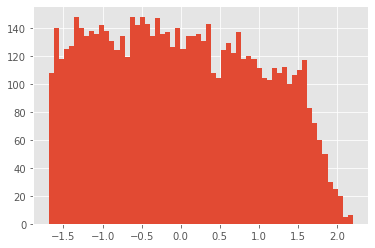

mean :  2.3116214259609874e-16
var  :  1.0000000000000042
skew :  0.13085770814063452
kurt :  -1.0942503769092888
shapiro :  ShapiroResult(statistic=0.9634251594543457, pvalue=2.238885244888129e-38)
normaltest :  NormaltestResult(statistic=2693.1458602871016, pvalue=0.0)


==================== equity_to_long-term_liability ====================


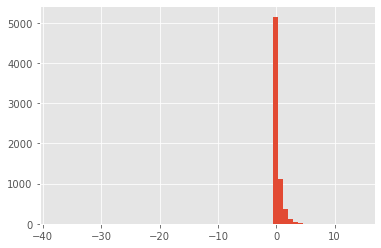

mean :  2.855303453550192e-15
var  :  0.9999999999999339
skew :  -4.721124194982175
kurt :  332.6693631482883
shapiro :  ShapiroResult(statistic=0.5268244743347168, pvalue=0.0)
normaltest :  NormaltestResult(statistic=7841.917770077065, pvalue=0.0)


==================== cash_flow_to_total_assets ====================


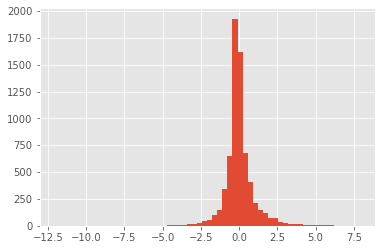

mean :  2.5628909953852437e-15
var  :  1.0000000000000009
skew :  0.2324176353001249
kurt :  13.31532121008335
shapiro :  ShapiroResult(statistic=0.8392693400382996, pvalue=0.0)
normaltest :  NormaltestResult(statistic=1451.081417768381, pvalue=0.0)


==================== cash_flow_to_liability ====================


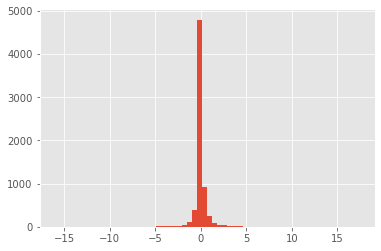

mean :  1.6872736119587409e-15
var  :  1.000000000000002
skew :  0.46658317773221136
kurt :  84.78652636028663
shapiro :  ShapiroResult(statistic=0.47148287296295166, pvalue=0.0)
normaltest :  NormaltestResult(statistic=2816.399578348685, pvalue=0.0)


==================== cfo_to_assets ====================


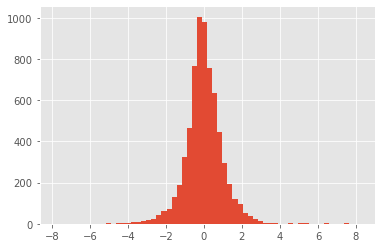

mean :  -9.247788209225531e-18
var  :  1.0000000000000002
skew :  0.17479492199216526
kurt :  6.208431612449795
shapiro :  ShapiroResult(statistic=0.9438822865486145, pvalue=4.203895392974451e-45)
normaltest :  NormaltestResult(statistic=918.8853050928598, pvalue=2.928136027147999e-200)


==================== cash_flow_to_equity ====================


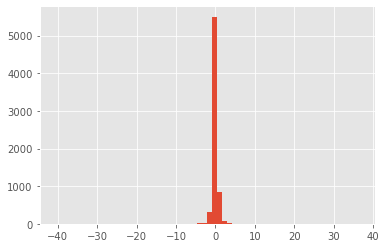

mean :  -4.452960624926838e-15
var  :  1.0000000000000038
skew :  -2.465167917964946
kurt :  700.048380013577
shapiro :  ShapiroResult(statistic=0.42934972047805786, pvalue=0.0)
normaltest :  NormaltestResult(statistic=6061.510285774572, pvalue=0.0)


==================== current_liabilities_to_current_assets ====================


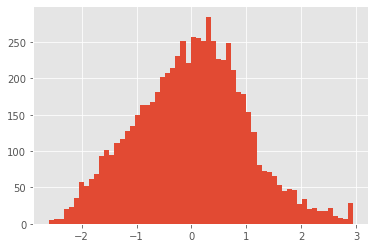

mean :  -1.0069994731348574e-16
var  :  1.0000000000000004
skew :  0.08619096743446836
kurt :  -0.1321647986999821
shapiro :  ShapiroResult(statistic=0.9956104159355164, pvalue=1.605642024503015e-13)
normaltest :  NormaltestResult(statistic=13.934107579766748, pvalue=0.0009424254029073721)


==================== net_income_to_total_assets ====================


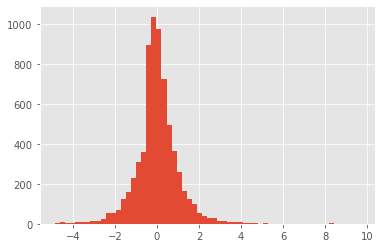

mean :  1.2152375210151294e-16
var  :  0.9999999999999996
skew :  0.35124360079468164
kurt :  5.696650889307385
shapiro :  ShapiroResult(statistic=0.9382356405258179, pvalue=0.0)
normaltest :  NormaltestResult(statistic=964.4133200338283, pvalue=3.8045948671550145e-210)


==================== total_assets_to_gnp_price ====================


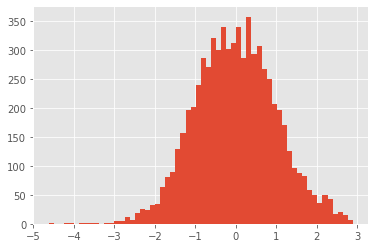

mean :  3.4112615943607976e-16
var  :  1.0000000000000036
skew :  0.022390781696720496
kurt :  0.06112497871976874
shapiro :  ShapiroResult(statistic=0.9982761740684509, pvalue=7.557091521448456e-07)
normaltest :  NormaltestResult(statistic=1.6648485106258208, pvalue=0.4349934718215216)


==================== no-credit_interval ====================


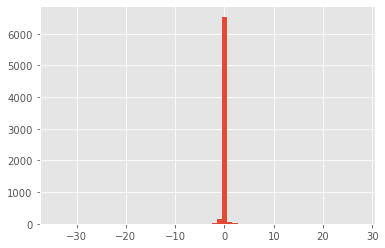

mean :  1.6805476471572523e-15
var  :  0.9999999999999989
skew :  -3.6648755489265183
kurt :  563.6540105780994
shapiro :  ShapiroResult(statistic=0.12693732976913452, pvalue=0.0)
normaltest :  NormaltestResult(statistic=7160.497062104222, pvalue=0.0)


==================== net_income_to_stockholder's_equity ====================


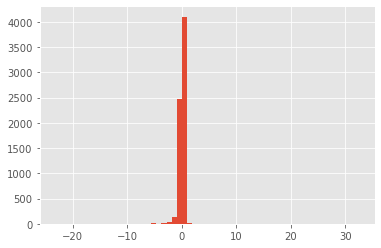

mean :  1.9296108436958734e-15
var  :  0.9999999999999979
skew :  6.392366327531701
kurt :  491.74715764896314
shapiro :  ShapiroResult(statistic=0.25913727283477783, pvalue=0.0)
normaltest :  NormaltestResult(statistic=9182.118337821576, pvalue=0.0)


==================== liability_to_equity ====================


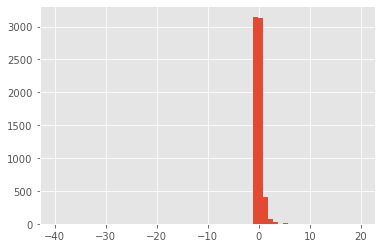

mean :  1.8433870225998658e-15
var  :  0.9999999999999949
skew :  -6.086766935805572
kurt :  481.01031343545577
shapiro :  ShapiroResult(statistic=0.3904043436050415, pvalue=0.0)
normaltest :  NormaltestResult(statistic=8972.020864089412, pvalue=0.0)


==================== degree_of_financial_leverage_(dfl) ====================


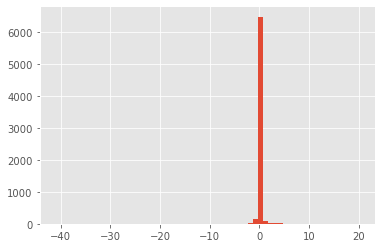

mean :  1.6312903025266598e-15
var  :  1.0000000000000178
skew :  -7.222534315311428
kurt :  597.4251995937896
shapiro :  ShapiroResult(statistic=0.14694678783416748, pvalue=0.0)
normaltest :  NormaltestResult(statistic=9771.401566725708, pvalue=0.0)


==================== interest_coverage_ratio(_interest_expense_to_ebit_) ====================


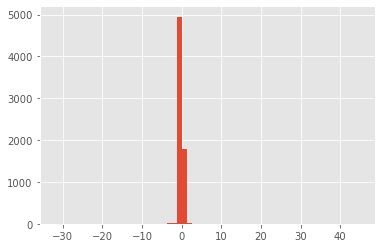

mean :  -4.99115991892545e-15
var  :  1.0000000000000009
skew :  4.2836487344818055
kurt :  929.1391550621267
shapiro :  ShapiroResult(statistic=0.1036105751991272, pvalue=0.0)
normaltest :  NormaltestResult(statistic=7856.264957959648, pvalue=0.0)


==================== equity_to_liability ====================


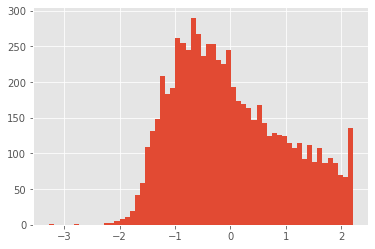

mean :  -7.561043740078057e-17
var  :  1.0000000000000004
skew :  0.4370684428997986
kurt :  -0.690085947246891
shapiro :  ShapiroResult(statistic=0.9639032483100891, pvalue=3.517101078988515e-38)
normaltest :  NormaltestResult(statistic=541.1704284313462, pvalue=3.0643232866595546e-118)


==================== one_if_total_liabilities_exceeds_total_assets_zero_otherwise_0 ====================


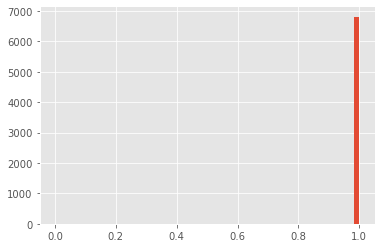

mean :  0.9988268074497727
var  :  0.0011718161694671183
skew :  -29.14405899270978
kurt :  847.3761745705476
shapiro :  ShapiroResult(statistic=0.013024389743804932, pvalue=0.0)
normaltest :  NormaltestResult(statistic=17460.52044601898, pvalue=0.0)


==================== one_if_total_liabilities_exceeds_total_assets_zero_otherwise_1 ====================


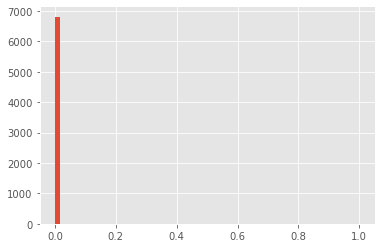

mean :  0.001173192550227306
var  :  0.0011718161694671183
skew :  29.14405899270977
kurt :  847.3761745705474
shapiro :  ShapiroResult(statistic=0.013024985790252686, pvalue=0.0)
normaltest :  NormaltestResult(statistic=17460.520446018767, pvalue=0.0)




In [23]:
abnormal_list = analyze_normal(df_normalize)

### Готовим выборку

In [24]:
d = {}
d['normal'] = split_df(
    df_normalize, 'target', prc_train=85, prc_valid=15, prc_test=0,
    target_test_value=np.nan, random_state=42
)
split_dict_struct(d)

==================== Structure =====================

normal -> X_train
normal -> X_valid
normal -> X_test
normal -> y_train
normal -> y_valid


In [25]:
# выводим список топ колонок, влияющих на целевую переменную через eli5
model_eli5 = select_eli5(
    pd.concat([ d['normal']['X_train'], d['normal']['X_valid'] ]),
    pd.concat([ d['normal']['y_train'], d['normal']['y_valid'] ]),
    xgb.XGBClassifier(**param_XGBClassifier),
    scoring='f1'
)

Weight,Feature
0.0549,persistent_eps_in_the_last_four_seasons
0.0477,borrowing_dependency
0.0467,net_income_to_stockholder's_equity
0.0325,debt_ratio%
0.0258,net_income_to_total_assets
0.0251,working_capital_to_total_assets
0.0249,pre-tax_net_profit/real_income_capital
0.0246,total_debt/total_net_worth
0.0235,total_assets_to_gnp_price
0.0221,current_liability_to_assets


Weight,Feature
0.3735 ± 0.0803,borrowing_dependency
0.1214 ± 0.0183,persistent_eps_in_the_last_four_seasons
0.0817 ± 0.0237,net_income_to_total_assets
0.0742 ± 0.0103,non-industry_revenue_and_expenditure/revenue
0.0619 ± 0.0199,interest-bearing_debt_interest_rate
0.0309 ± 0.0078,retained_earnings/total_assets
0.0166 ± 0.0046,equipment_rate_per_person
0.0148 ± 0.0038,inventory/working_capital
0.0129 ± 0.0037,interest_coverage_ratio(_interest_expense_to_ebit_)
0.0120 ± 0.0095,permanent_net_profit_growth_rate


### Работаем с несбалансированным датасетом

In [26]:
d['normal']['y_train'].value_counts()

0.00    2809
1.00      88
dtype: int64

In [27]:
d['upsample'] = transform_upsample(d['normal']['X_train'], d['normal']['y_train'], big_value=0, small_value=1)
d['upsample']['y_train'].value_counts()

0.00    2809
1.00    2809
Name: target, dtype: int64

In [28]:
d['downsample'] = transform_downsample(d['normal']['X_train'], d['normal']['y_train'], big_value=0, small_value=1)
d['downsample']['y_train'].value_counts()

0.00    88
1.00    88
Name: target, dtype: int64

In [29]:
d['smote'] = transform_smote(d['normal']['X_train'], d['normal']['y_train'])
d['smote']['y_train'].value_counts()

0.00    2809
1.00    2809
dtype: int64

### Делаем оценку по моделям

In [30]:
models, predictions = model_score(
    LazyClassifier,
    d['normal']['X_train'], d['normal']['y_train'], d['normal']['X_valid'], d['normal']['y_valid'],
    verbose=0, custom_metric=recall_score
)

 90%|█████████ | 27/30 [00:07<00:00,  7.97it/s]

[06:44:01] WARNING: /tmp/build/80754af9/xgboost-split_1619724447847/work/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


 97%|█████████▋| 29/30 [00:09<00:00,  2.39it/s]

Learning rate set to 0.016225
0:	learn: 0.6558566	total: 95.8ms	remaining: 1m 35s
1:	learn: 0.6253012	total: 107ms	remaining: 53.3s
2:	learn: 0.5933582	total: 119ms	remaining: 39.6s
3:	learn: 0.5640391	total: 132ms	remaining: 32.8s
4:	learn: 0.5356736	total: 143ms	remaining: 28.5s
5:	learn: 0.5141385	total: 154ms	remaining: 25.5s
6:	learn: 0.4897762	total: 165ms	remaining: 23.4s
7:	learn: 0.4686611	total: 176ms	remaining: 21.8s
8:	learn: 0.4480286	total: 186ms	remaining: 20.5s
9:	learn: 0.4292243	total: 198ms	remaining: 19.6s
10:	learn: 0.4108633	total: 210ms	remaining: 18.9s
11:	learn: 0.3960651	total: 222ms	remaining: 18.3s
12:	learn: 0.3811997	total: 233ms	remaining: 17.7s
13:	learn: 0.3634196	total: 245ms	remaining: 17.2s
14:	learn: 0.3483190	total: 256ms	remaining: 16.8s
15:	learn: 0.3323072	total: 268ms	remaining: 16.5s
16:	learn: 0.3193948	total: 282ms	remaining: 16.3s
17:	learn: 0.3079387	total: 297ms	remaining: 16.2s
18:	learn: 0.2958934	total: 310ms	remaining: 16s
19:	learn: 

182:	learn: 0.0499674	total: 1.81s	remaining: 8.08s
183:	learn: 0.0497973	total: 1.82s	remaining: 8.06s
184:	learn: 0.0495768	total: 1.83s	remaining: 8.04s
185:	learn: 0.0493479	total: 1.84s	remaining: 8.04s
186:	learn: 0.0491855	total: 1.85s	remaining: 8.03s
187:	learn: 0.0490337	total: 1.85s	remaining: 8.01s
188:	learn: 0.0488043	total: 1.86s	remaining: 8s
189:	learn: 0.0486008	total: 1.87s	remaining: 7.99s
190:	learn: 0.0483520	total: 1.88s	remaining: 7.98s
191:	learn: 0.0481844	total: 1.89s	remaining: 7.96s
192:	learn: 0.0480087	total: 1.9s	remaining: 7.95s
193:	learn: 0.0478522	total: 1.91s	remaining: 7.93s
194:	learn: 0.0477124	total: 1.92s	remaining: 7.91s
195:	learn: 0.0475720	total: 1.92s	remaining: 7.89s
196:	learn: 0.0474417	total: 1.93s	remaining: 7.88s
197:	learn: 0.0473013	total: 1.94s	remaining: 7.87s
198:	learn: 0.0469672	total: 1.95s	remaining: 7.86s
199:	learn: 0.0467808	total: 1.96s	remaining: 7.85s
200:	learn: 0.0466828	total: 1.97s	remaining: 7.84s
201:	learn: 0.04

362:	learn: 0.0300007	total: 3.43s	remaining: 6.03s
363:	learn: 0.0299304	total: 3.44s	remaining: 6.01s
364:	learn: 0.0299013	total: 3.45s	remaining: 6s
365:	learn: 0.0298642	total: 3.46s	remaining: 5.99s
366:	learn: 0.0298105	total: 3.47s	remaining: 5.98s
367:	learn: 0.0296829	total: 3.48s	remaining: 5.97s
368:	learn: 0.0296109	total: 3.49s	remaining: 5.97s
369:	learn: 0.0295553	total: 3.5s	remaining: 5.96s
370:	learn: 0.0294538	total: 3.51s	remaining: 5.95s
371:	learn: 0.0293723	total: 3.52s	remaining: 5.93s
372:	learn: 0.0293407	total: 3.52s	remaining: 5.92s
373:	learn: 0.0292962	total: 3.53s	remaining: 5.91s
374:	learn: 0.0291591	total: 3.54s	remaining: 5.9s
375:	learn: 0.0290661	total: 3.55s	remaining: 5.89s
376:	learn: 0.0290231	total: 3.56s	remaining: 5.87s
377:	learn: 0.0289560	total: 3.56s	remaining: 5.86s
378:	learn: 0.0288620	total: 3.57s	remaining: 5.86s
379:	learn: 0.0287718	total: 3.58s	remaining: 5.85s
380:	learn: 0.0287307	total: 3.59s	remaining: 5.84s
381:	learn: 0.028

530:	learn: 0.0211751	total: 5.05s	remaining: 4.46s
531:	learn: 0.0211498	total: 5.05s	remaining: 4.45s
532:	learn: 0.0211021	total: 5.07s	remaining: 4.44s
533:	learn: 0.0210884	total: 5.07s	remaining: 4.43s
534:	learn: 0.0210247	total: 5.08s	remaining: 4.42s
535:	learn: 0.0210098	total: 5.09s	remaining: 4.41s
536:	learn: 0.0209480	total: 5.1s	remaining: 4.39s
537:	learn: 0.0209276	total: 5.11s	remaining: 4.38s
538:	learn: 0.0209046	total: 5.12s	remaining: 4.37s
539:	learn: 0.0208685	total: 5.12s	remaining: 4.36s
540:	learn: 0.0207819	total: 5.13s	remaining: 4.35s
541:	learn: 0.0207110	total: 5.14s	remaining: 4.34s
542:	learn: 0.0206749	total: 5.15s	remaining: 4.33s
543:	learn: 0.0205988	total: 5.16s	remaining: 4.32s
544:	learn: 0.0205744	total: 5.17s	remaining: 4.31s
545:	learn: 0.0205308	total: 5.17s	remaining: 4.3s
546:	learn: 0.0204996	total: 5.18s	remaining: 4.29s
547:	learn: 0.0204468	total: 5.19s	remaining: 4.28s
548:	learn: 0.0204264	total: 5.2s	remaining: 4.27s
549:	learn: 0.0

705:	learn: 0.0150553	total: 6.66s	remaining: 2.77s
706:	learn: 0.0150213	total: 6.67s	remaining: 2.76s
707:	learn: 0.0149894	total: 6.68s	remaining: 2.75s
708:	learn: 0.0149514	total: 6.69s	remaining: 2.74s
709:	learn: 0.0149383	total: 6.69s	remaining: 2.73s
710:	learn: 0.0149004	total: 6.71s	remaining: 2.73s
711:	learn: 0.0148961	total: 6.72s	remaining: 2.72s
712:	learn: 0.0148651	total: 6.73s	remaining: 2.71s
713:	learn: 0.0148297	total: 6.74s	remaining: 2.7s
714:	learn: 0.0147831	total: 6.75s	remaining: 2.69s
715:	learn: 0.0147444	total: 6.75s	remaining: 2.68s
716:	learn: 0.0147108	total: 6.77s	remaining: 2.67s
717:	learn: 0.0146727	total: 6.78s	remaining: 2.66s
718:	learn: 0.0146399	total: 6.79s	remaining: 2.65s
719:	learn: 0.0146212	total: 6.8s	remaining: 2.64s
720:	learn: 0.0145897	total: 6.81s	remaining: 2.63s
721:	learn: 0.0145716	total: 6.82s	remaining: 2.63s
722:	learn: 0.0145316	total: 6.83s	remaining: 2.62s
723:	learn: 0.0144992	total: 6.84s	remaining: 2.61s
724:	learn: 0.

873:	learn: 0.0108296	total: 8.27s	remaining: 1.19s
874:	learn: 0.0108131	total: 8.28s	remaining: 1.18s
875:	learn: 0.0107931	total: 8.29s	remaining: 1.17s
876:	learn: 0.0107746	total: 8.3s	remaining: 1.16s
877:	learn: 0.0107674	total: 8.31s	remaining: 1.16s
878:	learn: 0.0107594	total: 8.32s	remaining: 1.15s
879:	learn: 0.0107396	total: 8.33s	remaining: 1.14s
880:	learn: 0.0107331	total: 8.34s	remaining: 1.13s
881:	learn: 0.0107087	total: 8.35s	remaining: 1.12s
882:	learn: 0.0106907	total: 8.36s	remaining: 1.11s
883:	learn: 0.0106824	total: 8.37s	remaining: 1.1s
884:	learn: 0.0106597	total: 8.38s	remaining: 1.09s
885:	learn: 0.0106419	total: 8.4s	remaining: 1.08s
886:	learn: 0.0106295	total: 8.41s	remaining: 1.07s
887:	learn: 0.0106143	total: 8.42s	remaining: 1.06s
888:	learn: 0.0106055	total: 8.43s	remaining: 1.05s
889:	learn: 0.0105940	total: 8.44s	remaining: 1.04s
890:	learn: 0.0105793	total: 8.45s	remaining: 1.03s
891:	learn: 0.0105735	total: 8.46s	remaining: 1.02s
892:	learn: 0.0

100%|██████████| 30/30 [00:19<00:00,  1.52it/s]

984:	learn: 0.0091293	total: 9.29s	remaining: 141ms
985:	learn: 0.0091201	total: 9.3s	remaining: 132ms
986:	learn: 0.0091055	total: 9.31s	remaining: 123ms
987:	learn: 0.0091015	total: 9.32s	remaining: 113ms
988:	learn: 0.0090847	total: 9.32s	remaining: 104ms
989:	learn: 0.0090723	total: 9.33s	remaining: 94.3ms
990:	learn: 0.0090526	total: 9.34s	remaining: 84.8ms
991:	learn: 0.0090351	total: 9.35s	remaining: 75.4ms
992:	learn: 0.0090295	total: 9.36s	remaining: 66ms
993:	learn: 0.0090245	total: 9.36s	remaining: 56.5ms
994:	learn: 0.0090199	total: 9.37s	remaining: 47.1ms
995:	learn: 0.0089793	total: 9.38s	remaining: 37.7ms
996:	learn: 0.0089693	total: 9.39s	remaining: 28.2ms
997:	learn: 0.0089661	total: 9.39s	remaining: 18.8ms
998:	learn: 0.0089540	total: 9.4s	remaining: 9.41ms
999:	learn: 0.0089409	total: 9.41s	remaining: 0us


In [31]:
models

,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,recall_score,Time Taken
Model,,,,,,
NearestCentroid,0.88,0.83,0.83,0.91,0.77,0.04
GaussianNB,0.94,0.82,0.82,0.95,0.68,0.03
BernoulliNB,0.80,0.76,0.76,0.86,0.73,0.06
LinearDiscriminantAnalysis,0.96,0.72,0.72,0.96,0.45,0.09
SGDClassifier,0.97,0.70,0.70,0.96,0.41,0.14
LogisticRegression,0.97,0.66,0.66,0.96,0.32,0.19
LabelPropagation,0.96,0.66,0.66,0.96,0.32,0.53
LabelSpreading,0.96,0.66,0.66,0.96,0.32,0.71
LinearSVC,0.96,0.63,0.63,0.95,0.27,0.24


### Тестовая модель

In [32]:
split_dict_struct(d)

==================== Structure =====================

normal -> X_train
normal -> X_valid
normal -> X_test
normal -> y_train
normal -> y_valid

upsample -> X_train
upsample -> y_train

downsample -> X_train
downsample -> y_train

smote -> X_train
smote -> y_train


  0%|          | 0/1 [00:00<?, ?it/s]

==================== Stage 1: train ====================

Best estimator: XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, eval_metric='mlogloss',
              gamma=0, gpu_id=-1, importance_type='gain',
              interaction_constraints='', learning_rate=0.1, max_delta_step=0,
              max_depth=5, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=100, n_jobs=4,
              num_parallel_tree=1, random_state=42, reg_alpha=0, reg_lambda=1,
              scale_pos_weight=1, subsample=1, tree_method='exact',
              use_label_encoder=False, validate_parameters=1, verbosity=None)
Best train score: 0.990683 make_scorer(f1_score, average=binary) using {'eval_metric': 'mlogloss', 'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 100, 'objective': 'binary:logistic', 'random_state': 42, 'use_label_encoder': False}

==================== Stage 2: valid =============

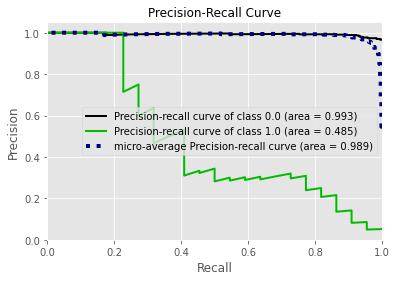

              precision    recall  f1-score   support

         0.0       0.97      0.98      0.98       490
         1.0       0.50      0.41      0.45        22

    accuracy                           0.96       512
   macro avg       0.74      0.70      0.71       512
weighted avg       0.95      0.96      0.95       512



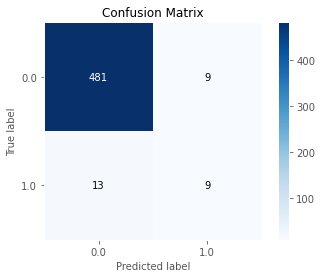

==================== Stage 2: learning curves =====================


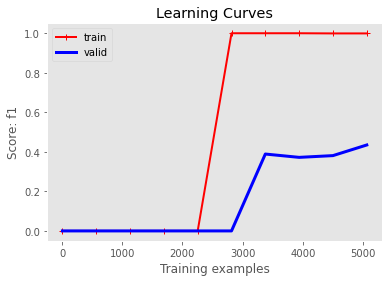

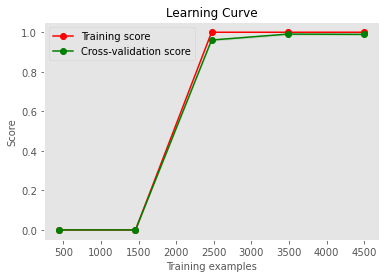

100%|██████████| 1/1 [00:34<00:00, 34.10s/it]


Weight,Feature
0.3801,pre-tax_net_profit/real_income_capital
0.0682,net_profit_per_share_before_tax_(yuan)
0.0629,net_income_to_stockholder's_equity
0.0464,persistent_eps_in_the_last_four_seasons
0.0322,total_debt/total_net_worth
0.0311,non-industry_revenue_and_expenditure/revenue
0.0239,borrowing_dependency
0.0237,cash_flow_to_sales
0.0203,equity_to_liability
0.0142,lo_ng-term_liability_to_current_assets


In [33]:
estimator = xgb.XGBClassifier
param_grid = locals()['params_' + estimator.__name__]
param_grid = {
    'max_depth':[5],
    'n_estimators':[100],
    'learning_rate':[0.1],
    'random_state': [42],
    'objective': ['binary:logistic'],
    'eval_metric': ['mlogloss'],
    'use_label_encoder': [False]
}
for i in tqdm([0]):
    d['normal_test'] = {}
    d['normal_test'][estimator.__name__] = model_fit(estimator, param_grid,
                                        d['upsample']['X_train'], d['upsample']['y_train'],
                                        d['normal']['X_valid'], d['normal']['y_valid'],
                                        d['normal']['X_test'],
                                        result=10, scoring='f1', learning_curves_dots=10,
                                        threshold=np.arange(0.1, 1, step=0.01))
eli5.explain_weights(d['normal_test'][estimator.__name__]['model'], top=20)

### Изучаем датасет normal

  0%|          | 0/1 [00:00<?, ?it/s]

==================== Stage 1: train ====================

Best estimator: XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, eval_metric='mlogloss',
              gamma=0, gpu_id=-1, importance_type='gain',
              interaction_constraints='', learning_rate=0.01, max_delta_step=1,
              max_depth=5, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=300, n_jobs=4,
              num_parallel_tree=1, random_state=42, reg_alpha=0, reg_lambda=1,
              scale_pos_weight=5, subsample=1, tree_method='exact',
              use_label_encoder=False, validate_parameters=1, verbosity=None)
Best train score: 0.470404 make_scorer(f1_score, average=binary) using {'eval_metric': 'mlogloss', 'gamma': 0, 'learning_rate': 0.01, 'max_delta_step': 1, 'max_depth': 5, 'min_child_weight': 1, 'n_estimators': 300, 'objective': 'binary:logistic', 'random_state': 42, 'scale_pos_weight': 

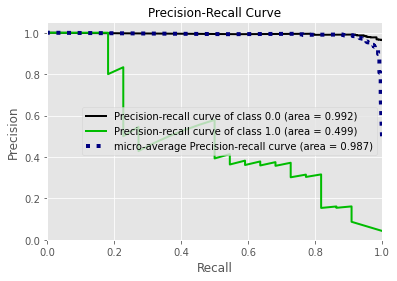

              precision    recall  f1-score   support

         0.0       0.98      0.98      0.98       490
         1.0       0.58      0.50      0.54        22

    accuracy                           0.96       512
   macro avg       0.78      0.74      0.76       512
weighted avg       0.96      0.96      0.96       512



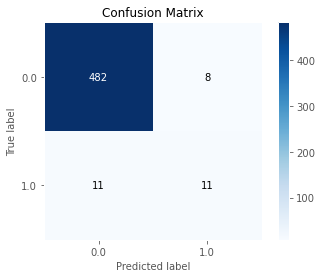

==================== Stage 2: learning curves =====================


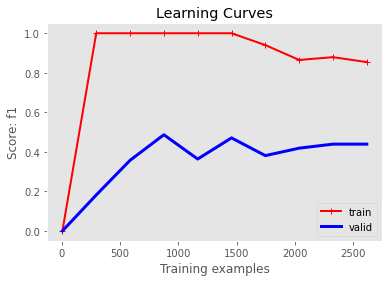

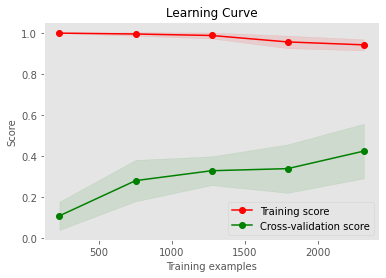

100%|██████████| 1/1 [38:56<00:00, 2336.70s/it]


Weight,Feature
0.0867,borrowing_dependency
0.0749,pre-tax_net_profit/real_income_capital
0.0492,persistent_eps_in_the_last_four_seasons
0.0393,total_debt/total_net_worth
0.0361,non-industry_revenue_and_expenditure/revenue
0.0340,net_income_to_total_assets
0.0256,cash_flow_to_liability
0.0241,interest-bearing_debt_interest_rate
0.0237,interest_coverage_ratio(_interest_expense_to_ebit_)
0.0234,inventory_and_accounts_receivable/net_value


In [34]:
estimator = xgb.XGBClassifier
param_grid = locals()['params_' + estimator.__name__]
param_grid = {
    'max_depth':[3, 5, 7],
    'n_estimators':[100, 300, 500, 700],
    'learning_rate':[0.01, 0.1],
    'gamma':[0],
    'scale_pos_weight':[5, 10],
    'max_delta_step':[1],
    'min_child_weight':[1, 3],
    'random_state': [42],
    'objective': ['binary:logistic'],
    'eval_metric': ['mlogloss'],
    'use_label_encoder': [False]
}
for i in tqdm([0]):
    d['normal'][estimator.__name__] = model_fit(
        estimator, param_grid,
        d['normal']['X_train'], d['normal']['y_train'],
        d['normal']['X_valid'], d['normal']['y_valid'],
        d['normal']['X_test'],
        result=15, scoring='f1', threshold=np.arange(0.1, 1, step=0.01)
    )
eli5.explain_weights(d['normal'][estimator.__name__]['model'], top=20)

  0%|          | 0/1 [00:00<?, ?it/s]

==================== Stage 1: train ====================

Best estimator: <catboost.core.CatBoostClassifier object at 0x7f77184423a0>
Best train score: 0.354581 make_scorer(f1_score, average=binary) using {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 700, 'random_state': 42, 'verbose': 0}

==================== Stage 2: valid ====================

Best valid score: 0.666667 using {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 700, 'random_state': 42, 'verbose': 0}

Best threshold score: 0.666667 using 0.250000



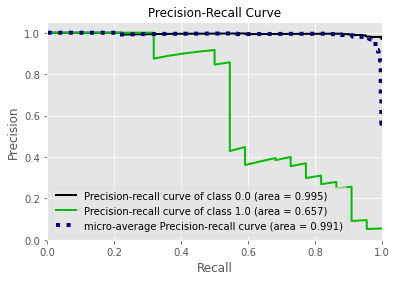

              precision    recall  f1-score   support

         0.0       0.98      1.00      0.99       490
         1.0       0.86      0.55      0.67        22

    accuracy                           0.98       512
   macro avg       0.92      0.77      0.83       512
weighted avg       0.97      0.98      0.97       512



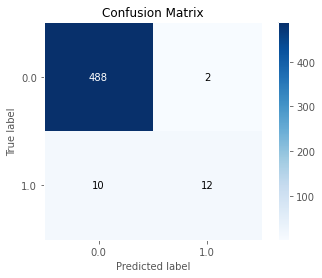

100%|██████████| 1/1 [07:31<00:00, 451.66s/it]


Weight,Feature
0.0893,borrowing_dependency
0.0638,non-industry_revenue_and_expenditure/revenue
0.0553,retained_earnings/total_assets
0.0490,interest-bearing_debt_interest_rate
0.0419,net_value/asset
0.0411,total_debt/total_net_worth
0.0338,persistent_eps_in_the_last_four_seasons
0.0322,net_profit_per_share_before_tax_(yuan)
0.0306,degree_of_financial_leverage_(dfl)
0.0292,net_income_to_total_assets


In [35]:
estimator = ctb.CatBoostClassifier
param_grid = locals()['params_' + estimator.__name__]
param_grid = {
    'max_depth':[3, 5, 7],
    'n_estimators':[100, 300, 500, 700],
    'learning_rate':[0.01, 0.1],
    'random_state': [42],
    'verbose': [0]
}
for i in tqdm([0]):
    d['normal'][estimator.__name__] = model_fit(
        estimator, param_grid,
        d['normal']['X_train'], d['normal']['y_train'],
        d['normal']['X_valid'], d['normal']['y_valid'],
        d['normal']['X_test'],
        result=8, scoring='f1', threshold=np.arange(0.1, 1, step=0.01),
        cv=5, learning_curves_dots=0
    )
eli5.explain_weights(d['normal'][estimator.__name__]['model'], top=20)

  0%|          | 0/1 [00:00<?, ?it/s]

==================== Stage 1: train ====================

Best estimator: LGBMClassifier(max_depth=10, min_child_weight=1, n_estimators=300,
               random_state=42)
Best train score: 0.337115 make_scorer(f1_score, average=binary) using {'learning_rate': 0.1, 'max_depth': 10, 'min_child_weight': 1, 'n_estimators': 300, 'random_state': 42}

==================== Stage 2: valid ====================

Best valid score: 0.600000 using {'learning_rate': 0.1, 'max_depth': 5, 'min_child_weight': 2, 'n_estimators': 700, 'random_state': 42}

Best threshold score: 0.600000 using 0.130000



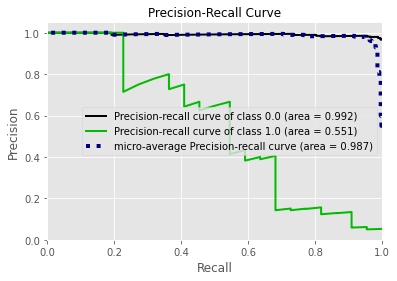

              precision    recall  f1-score   support

         0.0       0.98      0.99      0.98       490
         1.0       0.67      0.55      0.60        22

    accuracy                           0.97       512
   macro avg       0.82      0.77      0.79       512
weighted avg       0.97      0.97      0.97       512



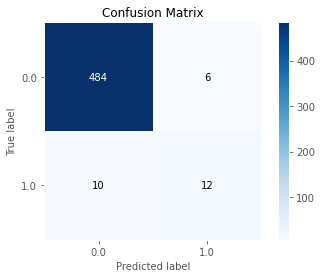

==================== Stage 2: learning curves =====================


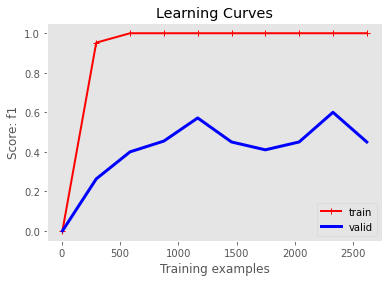

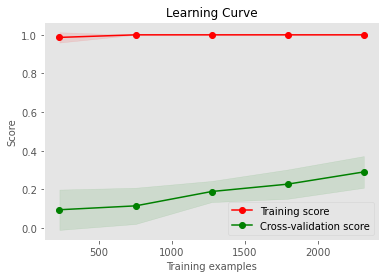

100%|██████████| 1/1 [07:45<00:00, 465.09s/it]


Weight,Feature
0.1369,borrowing_dependency
0.0741,retained_earnings/total_assets
0.0698,non-industry_revenue_and_expenditure/revenue
0.0587,interest-bearing_debt_interest_rate
0.0555,net_profit_per_share_before_tax_(yuan)
0.0532,persistent_eps_in_the_last_four_seasons
0.0241,debt_ratio%
0.0225,return_on_total_assets_growth_rate
0.0223,equipment_rate_per_person
0.0214,net_income_to_total_assets


In [36]:
estimator = lgb.LGBMClassifier
param_grid = locals()['params_' + estimator.__name__]
param_grid = {
    'max_depth':[3, 5, 7, 10],
    'n_estimators':[100, 300, 500, 700],
    'min_child_weight':[1, 2, 5],
    'learning_rate':[0.01, 0.1],
    'random_state': [42]
}
for i in tqdm([0]):
    d['normal'][estimator.__name__] = model_fit(
        estimator, param_grid,
        d['normal']['X_train'], d['normal']['y_train'],
        d['normal']['X_valid'], d['normal']['y_valid'],
        d['normal']['X_test'],
        result=15, scoring='f1', threshold=np.arange(0.1, 1, step=0.01)
    )
eli5.explain_weights(d['normal'][estimator.__name__]['model'], top=20)

### Изучаем датасет upsample

  0%|          | 0/1 [00:00<?, ?it/s]

==================== Stage 1: train ====================

Best estimator: XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, eval_metric='mlogloss',
              gamma=0, gpu_id=-1, importance_type='gain',
              interaction_constraints='', learning_rate=0.1, max_delta_step=1,
              max_depth=5, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=700, n_jobs=4,
              num_parallel_tree=1, random_state=42, reg_alpha=0, reg_lambda=1,
              scale_pos_weight=5, subsample=1, tree_method='exact',
              use_label_encoder=False, validate_parameters=1, verbosity=None)
Best train score: 0.991724 make_scorer(f1_score, average=binary) using {'eval_metric': 'mlogloss', 'gamma': 0, 'learning_rate': 0.1, 'max_delta_step': 1, 'max_depth': 5, 'min_child_weight': 1, 'n_estimators': 700, 'objective': 'binary:logistic', 'random_state': 42, 'scale_pos_weight': 5,

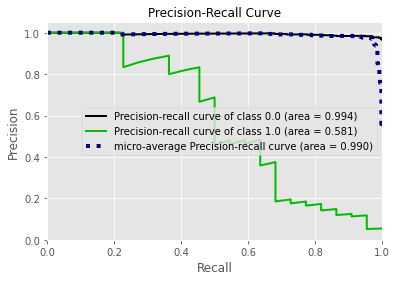

              precision    recall  f1-score   support

         0.0       0.98      1.00      0.99       490
         1.0       0.83      0.45      0.59        22

    accuracy                           0.97       512
   macro avg       0.90      0.73      0.79       512
weighted avg       0.97      0.97      0.97       512



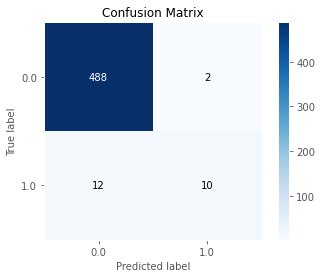

==================== Stage 2: learning curves =====================


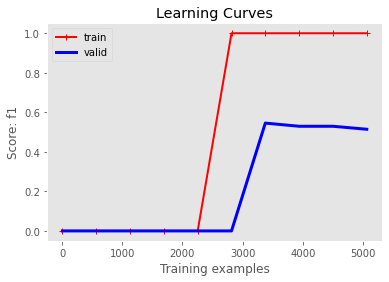

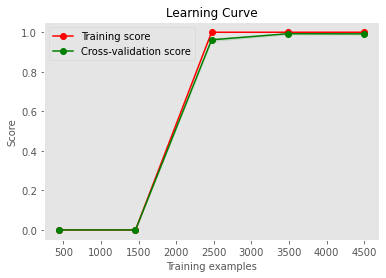

100%|██████████| 1/1 [53:49<00:00, 3229.13s/it]


Weight,Feature
0.2630,equity_to_liability
0.1659,pre-tax_net_profit/real_income_capital
0.0885,retained_earnings/total_assets
0.0376,net_income_to_stockholder's_equity
0.0311,borrowing_dependency
0.0299,total_debt/total_net_worth
0.0275,non-industry_revenue_and_expenditure/revenue
0.0266,net_income_to_total_assets
0.0233,tax_rate_(a)
0.0225,persistent_eps_in_the_last_four_seasons


In [37]:
estimator = xgb.XGBClassifier
param_grid = locals()['params_' + estimator.__name__]
param_grid = {
    'max_depth':[3, 5, 7],
    'n_estimators':[100, 300, 500, 700],
    'learning_rate':[0.01, 0.1],
    'gamma':[0],
    'scale_pos_weight':[5, 10],
    'max_delta_step':[1],
    'min_child_weight':[1, 3],
    'random_state': [42],
    'objective': ['binary:logistic'],
    'eval_metric': ['mlogloss'],
    'use_label_encoder': [False]
}
for i in tqdm([0]):
    d['upsample'][estimator.__name__] = model_fit(
        estimator, param_grid,
        d['upsample']['X_train'], d['upsample']['y_train'],
        d['normal']['X_valid'], d['normal']['y_valid'],
        d['normal']['X_test'],
        result=15, scoring='f1', threshold=np.arange(0.1, 1, step=0.01)
    )
eli5.explain_weights(d['upsample'][estimator.__name__]['model'], top=20)

  0%|          | 0/1 [00:00<?, ?it/s]

==================== Stage 1: train ====================

Best estimator: <catboost.core.CatBoostClassifier object at 0x7f770c1eccd0>
Best train score: 0.991716 make_scorer(f1_score, average=binary) using {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 300, 'random_state': 42, 'verbose': 0}

==================== Stage 2: valid ====================

Best valid score: 0.500000 using {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 500, 'random_state': 42, 'verbose': 0}

Best threshold score: 0.500000 using 0.380000



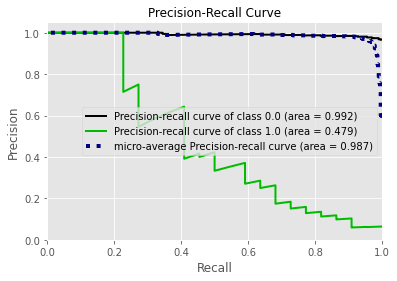

              precision    recall  f1-score   support

         0.0       0.97      0.99      0.98       490
         1.0       0.64      0.41      0.50        22

    accuracy                           0.96       512
   macro avg       0.81      0.70      0.74       512
weighted avg       0.96      0.96      0.96       512



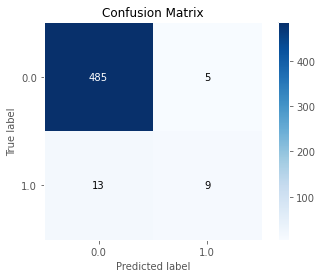

100%|██████████| 1/1 [08:54<00:00, 534.13s/it]


Weight,Feature
0.1016,borrowing_dependency
0.0566,non-industry_revenue_and_expenditure/revenue
0.0529,retained_earnings/total_assets
0.0473,interest-bearing_debt_interest_rate
0.0455,inventory/working_capital
0.0450,pre-tax_net_profit/real_income_capital
0.0429,cash_flow_per_share
0.0357,debt_ratio%
0.0352,persistent_eps_in_the_last_four_seasons
0.0248,total_assets_to_gnp_price


In [38]:
estimator = ctb.CatBoostClassifier
param_grid = locals()['params_' + estimator.__name__]
param_grid = {
    'max_depth':[3, 5, 7],
    'n_estimators':[100, 300, 500, 700],
    'learning_rate':[0.01, 0.1],
    'random_state': [42],
    'verbose': [0]
}
for i in tqdm([0]):
    d['upsample'][estimator.__name__] = model_fit(
        estimator, param_grid,
        d['upsample']['X_train'], d['upsample']['y_train'],
        d['normal']['X_valid'], d['normal']['y_valid'],
        d['normal']['X_test'],
        result=8, scoring='f1', threshold=np.arange(0.1, 1, step=0.01),
        cv=5, learning_curves_dots=0
    )
eli5.explain_weights(d['upsample'][estimator.__name__]['model'], top=20)

  0%|          | 0/1 [00:00<?, ?it/s]

==================== Stage 1: train ====================

Best estimator: LGBMClassifier(max_depth=7, min_child_weight=1, n_estimators=700,
               random_state=42)
Best train score: 0.993472 make_scorer(f1_score, average=binary) using {'learning_rate': 0.1, 'max_depth': 7, 'min_child_weight': 1, 'n_estimators': 700, 'random_state': 42}

==================== Stage 2: valid ====================

Best valid score: 0.585366 using {'learning_rate': 0.1, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 500, 'random_state': 42}

Best threshold score: 0.585366 using 0.210000



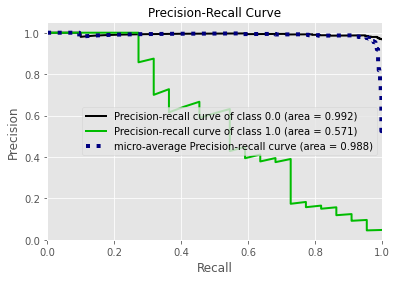

              precision    recall  f1-score   support

         0.0       0.98      0.99      0.98       490
         1.0       0.63      0.55      0.59        22

    accuracy                           0.97       512
   macro avg       0.81      0.77      0.78       512
weighted avg       0.96      0.97      0.97       512



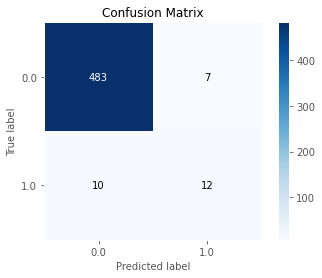

==================== Stage 2: learning curves =====================


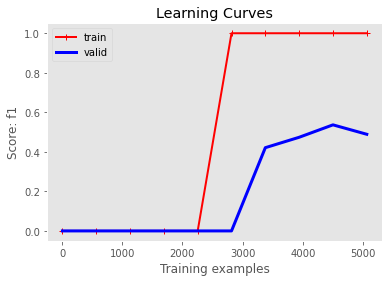

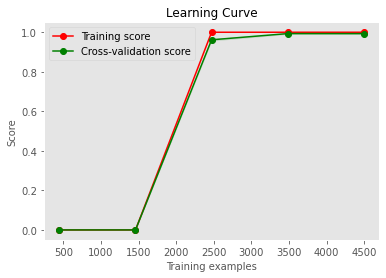

100%|██████████| 1/1 [15:11<00:00, 911.80s/it]


Weight,Feature
0.1056,persistent_eps_in_the_last_four_seasons
0.1025,non-industry_revenue_and_expenditure/revenue
0.0982,pre-tax_net_profit/real_income_capital
0.0870,borrowing_dependency
0.0699,total_debt/total_net_worth
0.0589,net_profit_per_share_before_tax_(yuan)
0.0391,retained_earnings/total_assets
0.0320,interest-bearing_debt_interest_rate
0.0306,net_income_to_total_assets
0.0276,cash_/_current_liability


In [39]:
estimator = lgb.LGBMClassifier
param_grid = locals()['params_' + estimator.__name__]
param_grid = {
    'max_depth':[3, 5, 7, 10],
    'n_estimators':[100, 300, 500, 700],
    'min_child_weight':[1, 2, 5],
    'learning_rate':[0.01, 0.1],
    'random_state': [42]
}
for i in tqdm([0]):
    d['upsample'][estimator.__name__] = model_fit(
        estimator, param_grid,
        d['upsample']['X_train'], d['upsample']['y_train'],
        d['normal']['X_valid'], d['normal']['y_valid'],
        d['normal']['X_test'],
        result=15, scoring='f1', threshold=np.arange(0.1, 1, step=0.01)
    )
eli5.explain_weights(d['upsample'][estimator.__name__]['model'], top=20)

### Изучаем датасет smote

  0%|          | 0/1 [00:00<?, ?it/s]

==================== Stage 1: train ====================

Best estimator: XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, eval_metric='mlogloss',
              gamma=0, gpu_id=-1, importance_type='gain',
              interaction_constraints='', learning_rate=0.1, max_delta_step=1,
              max_depth=7, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=700, n_jobs=4,
              num_parallel_tree=1, random_state=42, reg_alpha=0, reg_lambda=1,
              scale_pos_weight=5, subsample=1, tree_method='exact',
              use_label_encoder=False, validate_parameters=1, verbosity=None)
Best train score: 0.982017 make_scorer(f1_score, average=binary) using {'eval_metric': 'mlogloss', 'gamma': 0, 'learning_rate': 0.1, 'max_delta_step': 1, 'max_depth': 7, 'min_child_weight': 1, 'n_estimators': 700, 'objective': 'binary:logistic', 'random_state': 42, 'scale_pos_weight': 5,

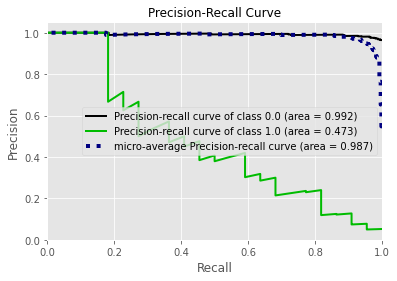

              precision    recall  f1-score   support

         0.0       0.98      0.96      0.97       490
         1.0       0.42      0.59      0.49        22

    accuracy                           0.95       512
   macro avg       0.70      0.78      0.73       512
weighted avg       0.96      0.95      0.95       512



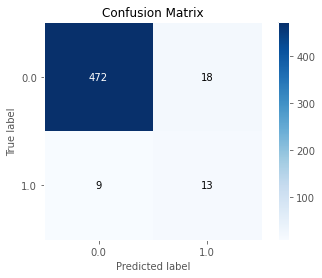

==================== Stage 2: learning curves =====================


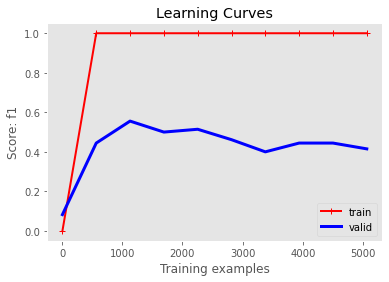

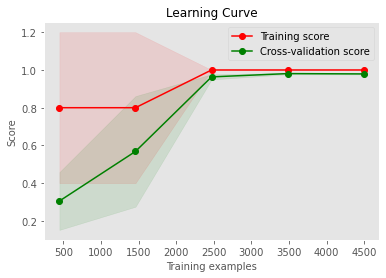

100%|██████████| 1/1 [1:27:42<00:00, 5262.44s/it]


Weight,Feature
0.2093,persistent_eps_in_the_last_four_seasons
0.1041,retained_earnings/total_assets
0.0782,net_income_to_total_assets
0.0732,total_debt/total_net_worth
0.0517,borrowing_dependency
0.0427,net_value/asset
0.0235,total_income_/_total_expense
0.0182,non-industry_revenue_and_expenditure/revenue
0.0181,cash_flow_ratio
0.0161,permanent_net_profit_growth_rate


In [40]:
estimator = xgb.XGBClassifier
param_grid = locals()['params_' + estimator.__name__]
param_grid = {
    'max_depth':[3, 5, 7],
    'n_estimators':[100, 300, 500, 700],
    'learning_rate':[0.01, 0.1],
    'gamma':[0],
    'scale_pos_weight':[5, 10],
    'max_delta_step':[1],
    'min_child_weight':[1, 3],
    'random_state': [42],
    'objective': ['binary:logistic'],
    'eval_metric': ['mlogloss'],
    'use_label_encoder': [False]
}
for i in tqdm([0]):
    d['smote'][estimator.__name__] = model_fit(
        estimator, param_grid,
        d['smote']['X_train'], d['smote']['y_train'],
        d['normal']['X_valid'], d['normal']['y_valid'],
        d['normal']['X_test'],
        result=15, scoring='f1', threshold=np.arange(0.1, 1, step=0.01)
    )
eli5.explain_weights(d['smote'][estimator.__name__]['model'], top=20)

  0%|          | 0/1 [00:00<?, ?it/s]

==================== Stage 1: train ====================

Best estimator: <catboost.core.CatBoostClassifier object at 0x7f770d5429a0>
Best train score: 0.985606 make_scorer(f1_score, average=binary) using {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 700, 'random_state': 42, 'verbose': 0}

==================== Stage 2: valid ====================

Best valid score: 0.440678 using {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 700, 'random_state': 42, 'verbose': 0}

Best threshold score: 0.440678 using 0.120000



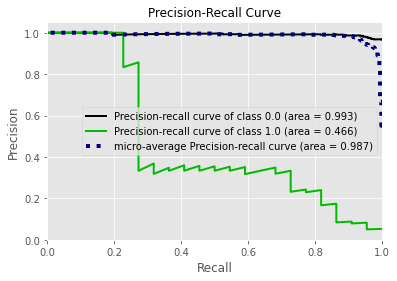

              precision    recall  f1-score   support

         0.0       0.98      0.95      0.97       490
         1.0       0.35      0.59      0.44        22

    accuracy                           0.94       512
   macro avg       0.67      0.77      0.70       512
weighted avg       0.95      0.94      0.94       512



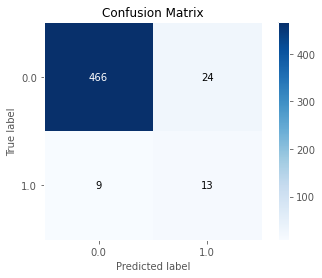

100%|██████████| 1/1 [09:15<00:00, 555.94s/it]


Weight,Feature
0.0475,non-industry_revenue_and_expenditure/revenue
0.0464,borrowing_dependency
0.0439,persistent_eps_in_the_last_four_seasons
0.0399,interest-bearing_debt_interest_rate
0.0396,equity_to_liability
0.0382,contingent_liabilities/net_value
0.0347,equity_to_long-term_liability
0.0329,retained_earnings/total_assets
0.0257,fix_assets_to_assets
0.0239,inventory/working_capital


In [41]:
estimator = ctb.CatBoostClassifier
param_grid = locals()['params_' + estimator.__name__]
param_grid = {
    'max_depth':[3, 5, 7],
    'n_estimators':[100, 300, 500, 700],
    'learning_rate':[0.01, 0.1],
    'random_state': [42],
    'verbose': [0]
}
for i in tqdm([0]):
    d['smote'][estimator.__name__] = model_fit(
        estimator, param_grid,
        d['smote']['X_train'], d['smote']['y_train'],
        d['normal']['X_valid'], d['normal']['y_valid'],
        d['normal']['X_test'],
        result=8, scoring='f1', threshold=np.arange(0.1, 1, step=0.01),
        cv=5, learning_curves_dots=0
    )
eli5.explain_weights(d['smote'][estimator.__name__]['model'], top=20)

  0%|          | 0/1 [00:00<?, ?it/s]

==================== Stage 1: train ====================

Best estimator: LGBMClassifier(max_depth=7, min_child_weight=1, n_estimators=300,
               random_state=42)
Best train score: 0.985795 make_scorer(f1_score, average=binary) using {'learning_rate': 0.1, 'max_depth': 7, 'min_child_weight': 1, 'n_estimators': 300, 'random_state': 42}

==================== Stage 2: valid ====================

Best valid score: 0.465116 using {'learning_rate': 0.1, 'max_depth': 5, 'min_child_weight': 1, 'n_estimators': 500, 'random_state': 42}

Best threshold score: 0.465116 using 0.340000



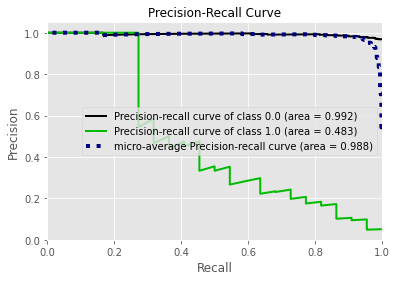

              precision    recall  f1-score   support

         0.0       0.98      0.98      0.98       490
         1.0       0.48      0.45      0.47        22

    accuracy                           0.96       512
   macro avg       0.73      0.72      0.72       512
weighted avg       0.95      0.96      0.95       512



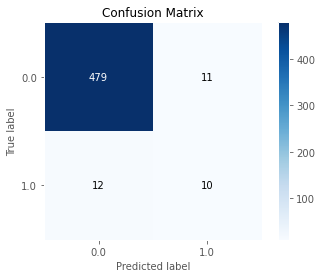

==================== Stage 2: learning curves =====================


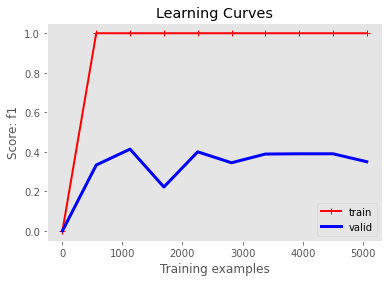

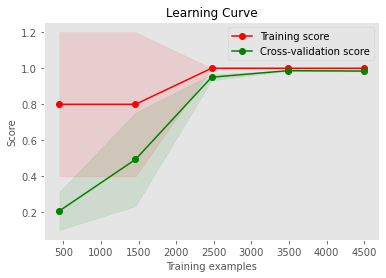

100%|██████████| 1/1 [15:16<00:00, 916.91s/it]


Weight,Feature
0.4081,persistent_eps_in_the_last_four_seasons
0.0758,total_debt/total_net_worth
0.0681,borrowing_dependency
0.0511,retained_earnings/total_assets
0.0232,non-industry_revenue_and_expenditure/revenue
0.0224,net_income_to_stockholder's_equity
0.0211,debt_ratio%
0.0204,interest-bearing_debt_interest_rate
0.0200,contingent_liabilities/net_value
0.0135,net_income_to_total_assets


In [42]:
estimator = lgb.LGBMClassifier
param_grid = locals()['params_' + estimator.__name__]
param_grid = {
    'max_depth':[3, 5, 7, 10],
    'n_estimators':[100, 300, 500, 700],
    'min_child_weight':[1, 2, 5],
    'learning_rate':[0.01, 0.1],
    'random_state': [42]
}
for i in tqdm([0]):
    d['smote'][estimator.__name__] = model_fit(
        estimator, param_grid,
        d['smote']['X_train'], d['smote']['y_train'],
        d['normal']['X_valid'], d['normal']['y_valid'],
        d['normal']['X_test'],
        result=15, scoring='f1', threshold=np.arange(0.1, 1, step=0.01)
    )
eli5.explain_weights(d['smote'][estimator.__name__]['model'], top=20)

### Объединяем модели

In [39]:
#np.save('./output/d.npy', d)
#d = np.load('./output/d.npy', allow_pickle='TRUE').item()
#bagging_pred = reload(sys.modules['magic_ds.ml.bagging']).bagging_pred
split_dict_struct(d)

==================== Structure =====================

normal -> X_train
normal -> X_valid
normal -> X_test
normal -> y_train
normal -> y_valid
normal -> XGBClassifier
normal -> XGBClassifier -> model
normal -> XGBClassifier -> y_pred
normal -> XGBClassifier -> y_valid_pred
normal -> CatBoostClassifier
normal -> CatBoostClassifier -> model
normal -> CatBoostClassifier -> y_pred
normal -> CatBoostClassifier -> y_valid_pred
normal -> LGBMClassifier
normal -> LGBMClassifier -> model
normal -> LGBMClassifier -> y_pred
normal -> LGBMClassifier -> y_valid_pred

upsample -> X_train
upsample -> y_train
upsample -> XGBClassifier
upsample -> XGBClassifier -> model
upsample -> XGBClassifier -> y_pred
upsample -> XGBClassifier -> y_valid_pred
upsample -> CatBoostClassifier
upsample -> CatBoostClassifier -> model
upsample -> CatBoostClassifier -> y_pred
upsample -> CatBoostClassifier -> y_valid_pred
upsample -> LGBMClassifier
upsample -> LGBMClassifier -> model
upsample -> LGBMClassifier -> y_pred
u

In [3]:
# подбираем коэффициенты для моделей
bagging_valid_pred_list = [
    d['normal']['XGBClassifier']['y_valid_pred'],
    d['normal']['CatBoostClassifier']['y_valid_pred'],
    d['normal']['LGBMClassifier']['y_valid_pred'],
    d['upsample']['XGBClassifier']['y_valid_pred'],
    d['upsample']['CatBoostClassifier']['y_valid_pred'],
    d['upsample']['LGBMClassifier']['y_valid_pred'],
    d['smote']['XGBClassifier']['y_valid_pred'],
    d['smote']['CatBoostClassifier']['y_valid_pred'],
    d['smote']['LGBMClassifier']['y_valid_pred']
]
bagging_pred_list = np.array([
    d['normal']['XGBClassifier']['y_pred'],
    d['normal']['CatBoostClassifier']['y_pred'],
    d['normal']['LGBMClassifier']['y_pred'],
    d['upsample']['XGBClassifier']['y_pred'],
    d['upsample']['CatBoostClassifier']['y_pred'],
    d['upsample']['LGBMClassifier']['y_pred'],
    d['smote']['XGBClassifier']['y_pred'],
    d['smote']['CatBoostClassifier']['y_pred'],
    d['smote']['LGBMClassifier']['y_pred']
])

df_bagging = bagging_coef(
    d['normal']['y_valid'].values, bagging_valid_pred_list,
    scoring_f=f1_score, range_from=0, range_max=0.5, range_step=0.1
)
df_bagging

100%|██████████| 6/6 [42:07<00:00, 421.32s/it]  


,a,b,c,d,e,f,g,h,i,threshold,score
114403,0.00,0.30,0.20,0.30,0.10,0.00,0.00,0.10,0.00,0.40,0.70
114430,0.00,0.30,0.20,0.30,0.20,0.00,0.00,0.00,0.00,0.40,0.70
118848,0.00,0.40,0.00,0.30,0.00,0.00,0.10,0.00,0.20,0.30,0.70
118875,0.00,0.40,0.00,0.30,0.00,0.00,0.30,0.00,0.00,0.30,0.70
118884,0.00,0.40,0.00,0.30,0.00,0.10,0.00,0.00,0.20,0.30,0.70
...,...,...,...,...,...,...,...,...,...,...,...
269716,0.30,0.50,0.00,0.10,0.10,0.00,0.00,0.00,0.00,0.40,0.70
269752,0.30,0.50,0.10,0.00,0.00,0.00,0.10,0.00,0.00,0.40,0.70
269761,0.30,0.50,0.10,0.00,0.00,0.10,0.00,0.00,0.00,0.40,0.70
269770,0.30,0.50,0.10,0.00,0.10,0.00,0.00,0.00,0.00,0.40,0.70


==================== Valid data =====================

Stage 1 valid predict:

0.00    470
0.10     17
0.20      4
0.30      4
0.40      2
0.50      3
0.60      1
0.70      1
0.70      1
0.80      1
0.90      3
1.00      5
dtype: int64

Stage 2 valid threshold 0.400000:

0    497
1     15
dtype: int64

Stage 2 classification report:

              precision    recall  f1-score   support

         0.0       0.98      1.00      0.99       490
         1.0       0.87      0.59      0.70        22

    accuracy                           0.98       512
   macro avg       0.92      0.79      0.85       512
weighted avg       0.98      0.98      0.98       512



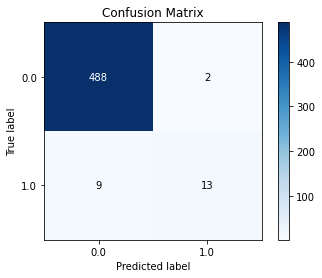

==================== Test data =====================

Stage 1 test predict:

0.00    3130
0.10     114
0.20      25
0.30      15
0.40      15
0.50      13
0.60      10
0.70      12
0.70       5
0.80       8
0.90      15
1.00      48
dtype: int64

Stage 2 valid threshold 0.400000:

0    3299
1     111
dtype: int64


In [43]:
y_valid_pred, y_pred = bagging_pred(
    df_bagging, bagging_valid_pred_list, bagging_pred_list,
    d['normal']['y_valid'].values, bagging_coef_first=np.nan
)

In [15]:
# сохраняем предикт
output = pd.DataFrame({'id': df_test['id'].values, 'target': y_pred.values})
save_csv(output, path='./output/', name='xgb_lgb_ctb_norm_upsm_smote_gen')